In [1]:
%config InlineBackend.figure_format = 'retina'


In [2]:
import pandas as pd
import numpy as np
import pickle
import importlib.machinery
import os
import scipy.stats as ss
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition, manifold
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, ConfusionMatrixDisplay # plot_confusion_matrix
import sklearn.metrics as le_me
from itertools import permutations
from tqdm import tqdm
import networkx as nx
import scipy.stats as stats
from sklearn.preprocessing import StandardScaler
import warnings
from matplotlib_venn import venn3, venn2
from scipy.stats import mannwhitneyu
from scipy.stats import zscore, stats
import torch



from scipy.stats import entropy
warnings.filterwarnings('ignore', category=UserWarning)


# Import your custom functions
functions = importlib.machinery.SourceFileLoader('module_name', './custom_functions.py').load_module()


2025-05-04 19:04:56.019432: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
# load TCGA data 
def load_dataframes(exps_filename, key_filename):
    """
    Load gene expression and key DataFrames from files.

    Inputs:
    - exps_filename (str): Path to gene expression file.
    - key_filename (str): Path to gene key file.

    Outputs:
    - gene_exps (DataFrame): Loaded gene expression data.
    - gene_key (DataFrame): Loaded gene key data.
    """
    gene_exps = pd.read_csv(exps_filename, index_col=0)
    gene_key = pd.read_csv(key_filename, index_col=0)
    return gene_exps, gene_key

def normalize_gene_expressions(df):
    """
    Normalize gene expressions using Z-score normalization, preserving the DataFrame structure.

    Inputs:
    - df (DataFrame): DataFrame with gene expression data.

    Outputs:
    - normalized_df (DataFrame): Normalized DataFrame with the same structure as the input.
    """
    # Identify numeric columns
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    
    # Apply z-score normalization only to numeric columns
    df[numeric_cols] = df[numeric_cols].apply(zscore, axis=0)  # Axis=0 ensures column-wise normalization
    
    return df


def load_clinical_manifest(directory):
    """
    Load the clinical manifest from a specified directory.

    Inputs:
    - directory (str): The directory path where the file is located.

    Outputs:
    - clinical_manifest (DataFrame): A DataFrame containing the clinical manifest data.
    """
    filepath = os.path.join(directory, 'clinical_gdc_manifest.txt')
    clinical_manifest = pd.read_csv(filepath, sep='\t')
    print('Clinical manifest shape:', clinical_manifest.shape)
    return clinical_manifest

def clean_dataframe(df):
    """
    Clean a clinical manifest DataFrame by removing irrelevant columns and standardizing health information.

    Inputs:
    - df (DataFrame): Clinical manifest to be cleaned.

    Outputs:
    - df_copy (DataFrame): Cleaned DataFrame.

    Function details:
    - Removes columns that are completely missing or have only uninformative values ('Not Reported', 'None').
    - Updates specific columns with 'healthy tissue' if the sample type indicates a healthy sample.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()

    # Define healthy sample types for classification
    healthy_sample_types = ['Blood Derived Normal', 'Bone Marrow Normal', 'Control Analyte', 'Solid Tissue Normal']

    # List of columns that might indicate health status
    health_info_columns = [
        "ajcc_pathologic_stage", "tumor_grade", "ajcc_pathologic_t", "ajcc_pathologic_m",
        "ajcc_pathologic_n", "figo_stage", "wilms_tumor_histologic_subtype", 'diagnosis_iss_stage',
        'diagnosis_ann_arbor_pathologic_stage', 'diagnosis_ajcc_pathologic_stage'
    ]

    # Remove irrelevant columns and update health information for relevant columns
    for column in df_copy.columns:
        unique_values = df_copy[column].dropna().unique()

        # Drop columns that are completely missing or contain only uninformative values
        if len(unique_values) == 0 or (len(unique_values) == 1 and unique_values[0] in ['Not Reported', 'not reported', 'None']):
            df_copy.drop(column, axis=1, inplace=True)
        else:
            # Update health information for specific columns
            if column in health_info_columns:
                condition = (
                    df_copy['sample_type'].isin(healthy_sample_types) & 
                    df_copy[column].notna() & 
                    df_copy[column].astype(str).str.strip().ne('')
                )
                df_copy.loc[condition, column] = 'healthy tissue'

    # Log the shape of the cleaned DataFrame
    print('Cleaned clinical manifest shape:', df_copy.shape)

    # Return the cleaned DataFrame
    return df_copy

def add_multiple_gene_expressions_to_clinical(gene_exps, clinical_manifest, gene_key, gene_names):
    """
    Add multiple gene expressions to the clinical manifest DataFrame.

    Parameters:
    - gene_exps: DataFrame containing gene expressions.
    - clinical_manifest: DataFrame containing clinical manifest data.
    - gene_key: DataFrame containing gene IDs and names.
    - gene_names: List of gene names to be added.

    Returns:
    - Updated clinical manifest DataFrame with gene expressions.
    """
    for gene_name in gene_names:
        # Find the ENSG code for the given gene_name
        gene_id = gene_key.loc[gene_key['gene_name'] == gene_name, 'gene_id'].iloc[0]
        
        # Extract the relevant gene expression column
        gene_exps_reset = gene_exps.reset_index()
        gene_expression_series = gene_exps_reset.set_index('filename')[gene_id]
        
        # Add the gene expression data to the clinical manifest
        clinical_manifest[gene_name] = clinical_manifest['filename'].apply(lambda x: gene_expression_series.get(x, None))
    
    # Reordering columns to have gene names as the first columns
    cols = gene_names + [col for col in clinical_manifest if col not in gene_names]
    updated_clinical_manifest = clinical_manifest[cols]
    
    return updated_clinical_manifest

def create_cancer_type_column(clinical_manifest):
    """
    Function use:
    Create and add a 'cancer_type' column to the clinical manifest DataFrame based on primary diagnoses.

    Inputs:
    - clinical_manifest (DataFrame): The clinical manifest DataFrame.

    Outputs:
    - new_clinical_manifest (DataFrame): Updated DataFrame with the 'cancer_type' column.

    Function details:
    - Determines cancer type using the 'diagnosis_primary_diagnosis' column.
    - Marks healthy samples as 'Healthy' based on sample types.
    """
    # Create a copy of the clinical manifest to avoid modifying the original DataFrame
    new_clinical_manifest = clinical_manifest.copy()

    # Add 'cancer_type' column using the classify_cancer_type function
    new_clinical_manifest['cancer_type'] = new_clinical_manifest['diagnosis_primary_diagnosis'].apply(classify_cancer_type)

    # Update 'cancer_type' to 'Healthy' for samples with specific healthy sample types
    healthy_sample_types = ['Blood Derived Normal', 'Bone Marrow Normal', 'Control Analyte', 'Solid Tissue Normal']
    new_clinical_manifest.loc[new_clinical_manifest['sample_type'].isin(healthy_sample_types), 'cancer_type'] = 'Healthy'
    
    # Return the updated DataFrame
    return new_clinical_manifest

def create_cancer_type_column(clinical_manifest):
    """
    Function use:
    Create and add a 'cancer_type' column to the clinical manifest DataFrame based on primary diagnoses.

    Inputs:
    - clinical_manifest (DataFrame): The clinical manifest DataFrame.

    Outputs:
    - new_clinical_manifest (DataFrame): Updated DataFrame with the 'cancer_type' column.

    Function details:
    - Determines cancer type using the 'diagnosis_primary_diagnosis' column.
    - Marks healthy samples as 'Healthy' based on sample types.
    """
    # Create a copy of the clinical manifest to avoid modifying the original DataFrame
    new_clinical_manifest = clinical_manifest.copy()

    # Add 'cancer_type' column using the classify_cancer_type function
    new_clinical_manifest['cancer_type'] = new_clinical_manifest['diagnosis_primary_diagnosis'].apply(classify_cancer_type)

    # Update 'cancer_type' to 'Healthy' for samples with specific healthy sample types
    healthy_sample_types = ['Blood Derived Normal', 'Bone Marrow Normal', 'Control Analyte', 'Solid Tissue Normal']
    new_clinical_manifest.loc[new_clinical_manifest['sample_type'].isin(healthy_sample_types), 'cancer_type'] = 'Healthy'
    
    # Return the updated DataFrame
    return new_clinical_manifest

def classify_cancer_type(row):
    """
    Classify cancer types into predefined categories based on primary diagnosis (blood and bone marrow).

    Inputs:
    - row (str): The diagnosis string to classify.

    Outputs:
    - str: The cancer type classification ('Leukemia', 'Lymphoma', 'Myeloma', 'Other_Cancer', or 'Unknown').

    Function details:
    - Matches diagnoses to predefined categories for Leukemia, Lymphoma, Myeloma, and Other_Cancer.
    - Default classification is 'Unknown' if the diagnosis does not match any predefined type.
    """
    leukemia_types = [
        "Acute myeloid leukemia, NOS", "Common precursor B ALL", "Acute lymphocytic leukemia",
        "Acute myeloid leukemia with mutated NPM1", "Acute lymphoblastic leukemia, NOS",
        "Acute myeloid leukemia with myelodysplasia-related changes", "Leukemia, NOS",
        "Acute myeloid leukemia, CBF-beta/MYH11", "Acute myeloid leukemia with mutated CEBPA",
        "Acute myelomonocytic leukemia", "Acute promyelocytic leukaemia, PML-RAR-alpha",
        "Atypical chronic myeloid leukemia, BCR/ABL negative", "Acute monoblastic and monocytic leukemia",
        "Chronic neutrophilic leukemia", "Acute myeloid leukemia with t(8;21)(q22;q22); RUNX1-RUNX1T1",
        "Acute myeloid leukemia with t(9;11)(p22;q23); MLLT3-MLL",
        "Acute myeloid leukemia with inv(3)(q21q26.2) or t(3;3)(q21;q26.2); RPN1-EVI1",
        "Acute leukemia, NOS", "Acute myeloid leukemia, minimal differentiation",
        "Precursor B-cell lymphoblastic leukemia", "Precursor cell lymphoblastic leukemia, not phenotyped",
        "Precursor cell lymphoblastic leukemia, NOS", "Chronic myelomonocytic leukemia, NOS",
        "Acute myeloid leukemia with t(6;9)(p23;q34); DEK-NUP214", "Mixed phenotype acute leukemia, T/myeloid, NOS",
        "Acute erythroid leukaemia", "Refractory anemia with excess blasts", "Subacute lymphoid leukemia",
        "Essential thrombocythemia", "Mixed phenotype acute leukemia, B/myeloid, NOS",
        "Acute megakaryoblastic leukaemia", "Undifferentiated leukaemia", "Lymphoid leukemia, NOS",
        "Myeloid leukemia associated with Down Syndrome", "Chronic lymphocytic leukemia"
    ]
    
    lymphoma_types = [
        "Burkitt lymphoma, NOS (Includes all variants)", "Diffuse large B-cell lymphoma, NOS",
        "Burkitt-like lymphoma", "B cell lymphoma, NOS", "EBV positive diffuse large B-cell lymphoma of the elderly",
        "Primary diffuse large B-cell lymphoma of the CNS",
        "B-cell lymphoma, unclassifiable, with features intermediate between diffuse large B-cell lymphoma and Burkitt lymphoma"
    ]
    
    myeloma_types = [
        "Multiple myeloma", "Plasma cell myeloma"
    ]
    
    other_types = [
        "Therapy related myeloid neoplasm", "Myelodysplastic/myeloproliferative neoplasm, unclassifiable",
        "Myloproliferative neoplasm, unclassifiable", "Myeloid sarcoma", "Myelodysplastic syndrome, unclassifiable",
        "Refractory cytopenia with multilineage dysplasia", "Neuroblastoma, NOS", "Osteosarcoma, NOS",
        "Neoplasm, uncertain whether benign or malignant", "Blastic plasmacytoid dendritic cell neoplasm",
        "Tumor, NOS"
    ]
    
    unknown_types = [
        "Not Reported", "Unknown"
    ]
    
    # Match the diagnosis to predefined categories
    if row in leukemia_types:
        return 'Leukemia'
    elif row in lymphoma_types:
        return 'Lymphoma'
    elif row in myeloma_types:
        return 'Myeloma'
    elif row in other_types:
        return 'Other_Cancer'
    elif row in unknown_types:
        return 'Unknown'
    else:
        # Default to 'Other' for unmatched diagnoses
        return 'Other'

def combine_stages(stage):
    """
    Combine detailed cancer stages into broader categories for standardization.

    Inputs:
    - stage (str): Detailed stage string.

    Outputs:
    - str: Combined stage string or 'Unknown' for missing/unknown data.

    Function details:
    - Maps detailed cancer stages (e.g., 'Stage IA') to broader categories (e.g., 'Stage I').
    - Returns 'Unknown' for missing or uninformative stage data.
    """
    # Define mapping from detailed to broader stages
    stage_mapping = {
        'Stage IA': 'Stage I', 'Stage IA1': 'Stage I', 'Stage IA2': 'Stage I', 'Stage IA3': 'Stage I', 'Stage IB': 'Stage I', 'Stage IC': 'Stage I',
        'Stage IIA': 'Stage II', 'Stage IIB': 'Stage II', 'Stage IIC': 'Stage II', 'Stage IIIC1': 'Stage II', 'Stage IIIC2': 'Stage II',
        'Stage IIIA': 'Stage III', 'Stage IIIB': 'Stage III', 'Stage IIIC': 'Stage III',
        'Stage IVA': 'Stage IV', 'Stage IVB': 'Stage IV', 'Stage IVC': 'Stage IV',
        'Stage X': 'Stage X'
    }
    
    # Handle missing or unknown stage values
    if pd.isna(stage) or stage in ["Unknown", "Not Reported"]:
        return "Unknown"
    
    # Return the mapped broader stage or the original stage if not in the mapping
    return stage_mapping.get(stage, stage)

def add_multiple_gene_expressions_to_clinical(gene_exps, clinical_manifest, gene_key, gene_names):
    """
    Add multiple gene expressions to the clinical manifest DataFrame.

    Parameters:
    - gene_exps: DataFrame containing gene expressions.
    - clinical_manifest: DataFrame containing clinical manifest data.
    - gene_key: DataFrame containing gene IDs and names.
    - gene_names: List of gene names to be added.

    Returns:
    - Updated clinical manifest DataFrame with gene expressions.
    """
    for gene_name in gene_names:
        # Find the ENSG code for the given gene_name
        gene_id = gene_key.loc[gene_key['gene_name'] == gene_name, 'gene_id'].iloc[0]
        
        # Extract the relevant gene expression column
        gene_exps_reset = gene_exps.reset_index()
        gene_expression_series = gene_exps_reset.set_index('filename')[gene_id]
        
        # Add the gene expression data to the clinical manifest
        clinical_manifest[gene_name] = clinical_manifest['filename'].apply(lambda x: gene_expression_series.get(x, None))
    
    # Reordering columns to have gene names as the first columns
    cols = gene_names + [col for col in clinical_manifest if col not in gene_names]
    updated_clinical_manifest = clinical_manifest[cols]
    
    return updated_clinical_manifest

def add_multiple_gene_expressions_to_clinical(gene_exps, clinical_manifest, gene_key, gene_names):
    """
    Add multiple gene expressions to the clinical manifest DataFrame.

    Parameters:
    - gene_exps: DataFrame containing gene expressions.
    - clinical_manifest: DataFrame containing clinical manifest data.
    - gene_key: DataFrame containing gene IDs and names.
    - gene_names: List of gene names to be added.

    Returns:
    - Updated clinical manifest DataFrame with gene expressions.
    """
    # Remove version numbers from gene IDs
    gene_key['gene_id'] = gene_key['gene_id'].str.split('.').str[0]
    gene_exps_reset = gene_exps.reset_index()
    gene_exps_reset.columns = gene_exps_reset.columns.str.split('.').str[0]

    for gene_name in gene_names:
        try:
            # Find the ENSG code for the given gene_name
            gene_id = gene_key.loc[gene_key['gene_name'] == gene_name, 'gene_id'].iloc[0]
        except IndexError:
            print(f"Gene name '{gene_name}' not found in gene_key.")
            continue

        if gene_id not in gene_exps_reset.columns:
            print(f"Gene ID '{gene_id}' for gene '{gene_name}' not found in gene_exps.")
            continue

        # Extract the relevant gene expression column
        gene_expression_series = gene_exps_reset.set_index('filename')[gene_id]

        # Add the gene expression data to the clinical manifest
        clinical_manifest[gene_name] = clinical_manifest['filename'].apply(lambda x: gene_expression_series.get(x, None))

    # Reordering columns to have gene names as the first columns
    cols = gene_names + [col for col in clinical_manifest if col not in gene_names]
    updated_clinical_manifest = clinical_manifest[cols]

    return updated_clinical_manifest
def process_gene_expression_data(clinical_manifest, gene_exps, gene_key):
    """
    Process clinical manifest and gene expression data to produce a final DataFrame.

    Args:
    - clinical_manifest (DataFrame): Clinical manifest containing metadata and cancer stage.
    - gene_exps (DataFrame): Gene expression data with ENSG IDs as columns and filenames as index.
    - gene_key (DataFrame): Mapping of ENSG IDs to gene names.

    Returns:
    - DataFrame: A DataFrame with filename as row names, gene names as columns (or gene names with ENSG ID if duplicates), and an output column.
    """
    # Step 1: Ensure filename column is present in gene_exps
    gene_exps = gene_exps.reset_index()

    # Step 2: Merge clinical manifest with gene expression data
    merged_df = clinical_manifest[['filename', 'cancer_stage']].merge(gene_exps, on='filename', how='inner')

    # Step 3: Map ENSG IDs to gene names
    ensg_to_gene = dict(zip(gene_key['gene_id'], gene_key['gene_name']))
    gene_columns = [col for col in merged_df.columns if col.startswith('ENSG')]

    # Create a DataFrame to handle renaming efficiently
    renaming_df = pd.DataFrame({'ensg_id': gene_columns})
    renaming_df['gene_name'] = renaming_df['ensg_id'].map(ensg_to_gene)
    renaming_df['gene_name'] = renaming_df.apply(
        lambda row: ensg_to_gene.get(row['ensg_id'].split('.')[0], row['ensg_id']) 
        if pd.isna(row['gene_name']) else row['gene_name'], axis=1
    )

    # Add ENSG ID to duplicated gene names
    gene_name_counts = renaming_df['gene_name'].value_counts()
    renaming_df['final_name'] = renaming_df.apply(
        lambda row: f"{row['gene_name']}({row['ensg_id']})" if gene_name_counts[row['gene_name']] > 1 else row['gene_name'], axis=1
    )

    renamed_columns = dict(zip(renaming_df['ensg_id'], renaming_df['final_name']))
    merged_df.rename(columns=renamed_columns, inplace=True)

    # Step 4: Shift gene expression values to make them positive
    gene_data = merged_df[list(renamed_columns.values())]
    min_values = gene_data.min()
    gene_data += (abs(min_values) + 1e-6)  # Small constant to avoid zero values
    merged_df.update(gene_data)

    # Step 4: Reorder columns with `output` first, followed by gene names
    merged_df['output'] = merged_df['cancer_stage'].map(
        lambda x: -1 if x.lower() in ['healthy', 'healthy tissue'] else
                  0 if x in ['Stage I', 'Stage II'] else
                  1 if 'Stage' in str(x) else -99
    )
    # Step 4: Reorder columns with `output` first, followed by gene names
    merged_df['output'] = merged_df['cancer_stage'].map(
        lambda x: 0 if x.lower() in ['healthy', 'healthy tissue'] else
                  1 if x in ['Stage I', 'Stage II'] else
                  1 if 'Stage' in str(x) else -99
    )
    
    # Step 6: Reorder columns with output first, followed by genes
    final_columns = ['output'] + list(renamed_columns.values())
    final_df = merged_df[['filename'] + final_columns]
    final_df.set_index('filename', inplace=True)

    return final_df

from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import numpy as np
from sklearn import manifold
import umap
from matplotlib.colors import Normalize

def visualize_training_data_with_umap_and_tsne(X_train, y_train):
    """
    Perform initial visualization of the training data using UMAP and t-SNE.

    Parameters
    ----------
    X_train : numpy array
        The training features.

    y_train : pandas Series or numpy array
        The training labels.
    """

    # Encode labels as integers
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(y_train)

    # Generate colormap and normalization for discrete labels
    num_labels = len(np.unique(encoded_labels))
    colormap = plt.cm.bwr
    norm = Normalize(vmin=0, vmax=num_labels - 1)

    # Create a figure with subplots for UMAP and t-SNE visualizations
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle('Visualization of training data using UMAP and t-SNE')

    # UMAP plot
    umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)
    umap_out = umap_model.fit_transform(X_train)
    axs[0].scatter(umap_out[:, 0], umap_out[:, 1], c=encoded_labels, cmap=colormap, norm=norm, alpha=0.5)
    axs[0].set_title('UMAP')
    axs[0].set_xlabel('UMAP Component 1')
    axs[0].set_ylabel('UMAP Component 2')

    # t-SNE plot
    tsne = manifold.TSNE(n_components=2, learning_rate='auto', init='random', perplexity=30, random_state=0)
    tsne_out = tsne.fit_transform(X_train)
    axs[1].scatter(tsne_out[:, 0], tsne_out[:, 1], c=encoded_labels, cmap=colormap, norm=norm, alpha=0.5)
    axs[1].set_title('t-SNE')
    axs[1].set_xlabel('t-SNE Component 1')
    axs[1].set_ylabel('t-SNE Component 2')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

import os
import pickle

def save_pickle_data(save_dir, **kwargs):
    """
    Save multiple objects as pickle files in the specified directory.

    Parameters:
    - save_dir: str, the directory to save the pickle files.
    - kwargs: key-value pairs of object names and objects to save.
    """
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    for name, data in kwargs.items():
        file_path = os.path.join(save_dir, f"{name}.pkl")
        with open(file_path, "wb") as f:
            pickle.dump(data, f)
        print(f"Saved {name} to {file_path}")

def load_pickle_data(load_dir, *args):
    """
    Load multiple objects from pickle files in the specified directory.

    Parameters:
    - load_dir: str, the directory to load the pickle files from.
    - args: list of object names to load.

    Returns:
    - A dictionary of loaded objects.
    """
    loaded_data = {}

    for name in args:
        file_path = os.path.join(load_dir, f"{name}.pkl")
        if not os.path.exists(file_path):
            raise FileNotFoundError(f"{file_path} does not exist.")

        with open(file_path, "rb") as f:
            loaded_data[name] = pickle.load(f)
        print(f"Loaded {name} from {file_path}")

    return loaded_data

def model_evaluation(model, X_train, y_train, folds=5):
    """
    Perform k-fold cross-validation and plot stacked AUROC and AUPRC curves.

    Parameters
    ----------
    model : object
        The model to be evaluated.

    X_train : numpy array
        The training features.

    y_train : numpy array
        The training labels.

    folds : int, default=5
        The number of cross-validation folds.
    """
    from sklearn.model_selection import StratifiedKFold
    from sklearn.metrics import roc_curve, precision_recall_curve, auc, f1_score, accuracy_score
    import numpy as np
    import matplotlib.pyplot as plt

    cv = StratifiedKFold(n_splits=folds)

    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    precision_array = []
    recall_array = []
    pr_aucs = []
    mean_recall = np.linspace(0, 1, 100)

    f1_scores = []
    accuracy_scores = []

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    for i, (train, test) in enumerate(cv.split(X_train, y_train)):
        model.fit(X_train[train], y_train[train])
        y_pred = model.predict(X_train[test])
        y_score = model.predict_proba(X_train[test])[:, 1]

        # Compute ROC curve and ROC area
        fpr, tpr, _ = roc_curve(y_train[test], y_score)
        interp_tpr = np.interp(mean_fpr, fpr, tpr)  # Align TPR to mean FPR
        interp_tpr[0] = 0.0  # Set the first value to 0
        tprs.append(interp_tpr)
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)

        ax1.plot(fpr, tpr, lw=1, alpha=0.3, label=f'ROC fold {i} (AUC = {roc_auc:.2f})')

        # Compute precision-recall curve and PR area
        precision, recall, _ = precision_recall_curve(y_train[test], y_score)
        interp_precision = np.interp(mean_recall, recall[::-1], precision[::-1])  # Align precision
        precision_array.append(interp_precision)
        pr_auc = auc(recall, precision)
        pr_aucs.append(pr_auc)

        ax2.plot(recall, precision, lw=1, alpha=0.3, label=f'PR fold {i} (AUC = {pr_auc:.2f})')

        # Compute F1 score and accuracy
        f1_scores.append(f1_score(y_train[test], y_pred))
        accuracy_scores.append(accuracy_score(y_train[test], y_pred))

    # Plot mean ROC curve
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    ax1.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC (AUC = {mean_auc:.2f})', lw=2, alpha=.8)
    ax1.plot([0, 1], [0, 1], color='grey', linestyle='--')
    ax1.set_title('ROC Curve')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.legend(loc="lower right")

    # Plot mean PR curve
    mean_precision = np.mean(precision_array, axis=0)
    mean_pr_auc = auc(mean_recall, mean_precision)
    ax2.plot(mean_recall, mean_precision, color='b', label=f'Mean PR (AUC = {mean_pr_auc:.2f})', lw=2, alpha=.8)
    ax2.plot([0, 1], [np.mean(y_train), np.mean(y_train)], color='grey', linestyle='--')
    ax2.set_title('Precision-Recall Curve')
    ax2.set_xlabel('Recall')
    ax2.set_ylabel('Precision')
    ax2.legend(loc="lower right")

    plt.tight_layout()
    plt.show()

    print(f"Average F1 score: {np.mean(f1_scores):.2f}")
    print(f"Average Accuracy: {np.mean(accuracy_scores):.2f}")
    print(f"Average AUROC: {np.mean(aucs):.2f}")
    print(f"Average AUPRC: {np.mean(pr_aucs):.2f}")


In [4]:
cancer = "thyroid"
gene_names = ["OGA", "OGT"]

clinical_manifest = load_clinical_manifest(f'./data/TCGA_GeneExpression/{cancer}/')
clinical_manifest = clean_dataframe(clinical_manifest)

gene_exps, gene_key = load_dataframes(f'./data/TCGA_GeneExpression/{cancer}/gene_expression.csv', 
                                              f'./data/TCGA_GeneExpression/{cancer}/gene_key.csv')
gene_exps = normalize_gene_expressions(gene_exps)

clinical_manifest_duo = add_multiple_gene_expressions_to_clinical(gene_exps, clinical_manifest, gene_key, gene_names)
clinical_manifest_duo = create_cancer_type_column(clinical_manifest_duo)
clinical_manifest_duo['cancer_stage'] = clinical_manifest_duo['diagnosis_ajcc_pathologic_stage'].apply(combine_stages)


clean_data = process_gene_expression_data(clinical_manifest_duo, gene_exps, gene_key)
print(clean_data['output'].value_counts())
clean_data = clean_data[(clean_data['output'].isin([0, 1]))]
print(clean_data['output'].value_counts())
clean_data.columns = pd.MultiIndex.from_tuples([(col,) for col in clean_data.columns])
clean_data = clean_data.dropna(axis=1)
clean_data

Clinical manifest shape: (1402, 177)
Cleaned clinical manifest shape: (1402, 55)
output
-99    809
 1     523
 0      70
Name: count, dtype: int64
output
1    523
0     70
Name: count, dtype: int64


,output,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,...,AC010980.1,AC007511.1,AC004233.4,AC092910.4,AC073611.1,AC078856.1,AC008763.4,AL592295.6,AL391628.1,AP006621.6
filename,,,,,,,,,,,,,,,,,,,,,
8b08d8d5-1a6e-483b-8345-246ab47ac267.rna_seq.augmented_star_gene_counts.tsv,0,2.945427,0.768339,4.781930,2.630002,2.010509,0.132881,1.574673,1.873962,1.465884,...,1.658412,0.000001,0.483990,1.529400,2.556993,1.854261,0.000001,3.426198,1.128247,0.715658
06841058-69f5-4639-94a3-b6e6e4914927.rna_seq.augmented_star_gene_counts.tsv,1,3.135012,0.888349,4.034540,2.658343,2.292394,1.283409,2.820923,1.733046,1.540584,...,0.364232,0.000001,2.247058,1.144237,1.278497,1.192056,0.000001,2.918752,1.816476,0.860139
dbee7256-1797-4a9d-9433-49599f92f5bd.rna_seq.augmented_star_gene_counts.tsv,0,3.032546,0.991805,3.996904,3.495708,1.816487,0.247406,0.657483,1.884571,1.884461,...,2.630778,0.000001,0.431070,0.653583,1.476853,1.134806,0.000001,3.478233,1.241071,0.852713
174d8f76-21ab-445d-93ee-e8ebbc61c134.rna_seq.augmented_star_gene_counts.tsv,0,2.991223,1.776696,3.966767,3.336087,2.456325,0.377313,1.112132,1.926761,1.643508,...,1.769435,0.000001,0.276548,1.377446,2.935673,1.868474,0.000001,3.524839,1.444155,0.898623
5dfbc8a2-345d-437d-b6cf-b81d26ced58d.rna_seq.augmented_star_gene_counts.tsv,0,3.322745,0.864898,4.387311,3.466140,2.669845,0.721920,1.348581,1.993420,1.435538,...,1.401091,0.000001,1.083582,1.292240,2.196345,1.083174,0.000001,3.718454,1.895454,0.650843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27d57c31-b3fd-445c-a04b-324ec1999bb6.rna_seq.augmented_star_gene_counts.tsv,1,3.327580,0.000001,3.948616,1.567131,2.187680,2.347795,2.124224,4.193274,0.603174,...,0.083106,0.000001,0.040333,0.000001,1.370462,0.000001,0.000001,1.602790,0.801055,1.740532
16b193ec-6a1a-420b-9dbf-f49ca38e835f.rna_seq.augmented_star_gene_counts.tsv,1,3.444308,0.549011,3.522655,1.969802,1.743789,2.444561,1.298080,3.097644,1.262887,...,0.021426,0.000001,0.077840,0.000001,0.697854,0.000001,0.000001,2.843097,0.688231,1.475874
2b7a660d-f472-476a-9145-cae4f3ba5e4c.rna_seq.augmented_star_gene_counts.tsv,1,2.658980,0.103458,2.867630,3.042733,1.004533,0.224097,0.134059,2.189781,1.410375,...,3.449704,0.000001,0.039177,0.000001,1.366856,0.018517,0.967213,4.107447,1.173376,0.444923


x_train shape: (474, 58189)    y_train shape: (474,)
x_test shape : (119, 58189)    y_test shape: (119,)


/Users/rstojsin/miniconda3/envs/tf_env/lib/python3.11/site-packages/threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


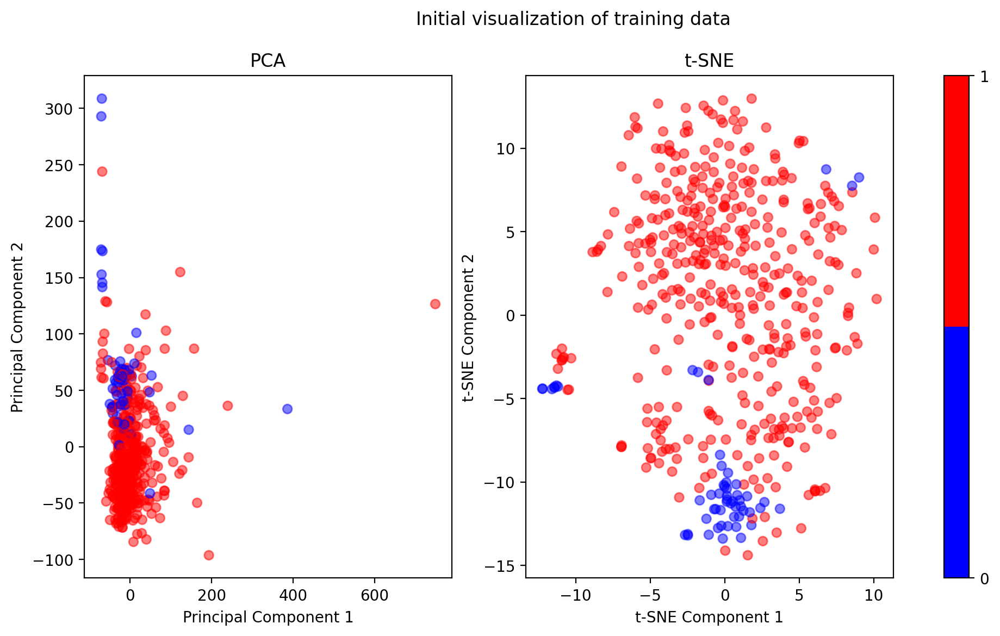

In [5]:
x_train, x_test, y_train, y_test = functions.train_test_splitting(clean_data)
functions.visualize_training_data(x_train, y_train)

--- {'KernelPCA'}  ---


/Users/rstojsin/miniconda3/envs/tf_env/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


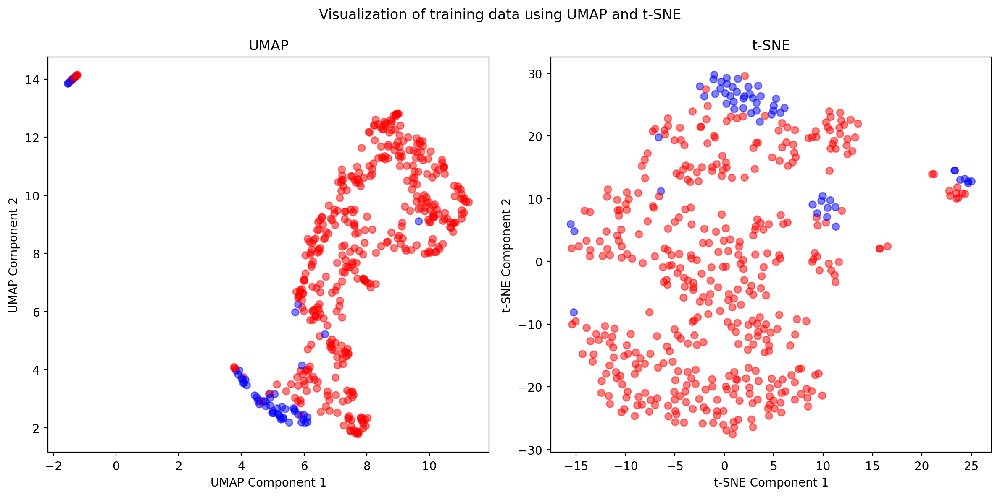

In [6]:

k = 10
# 'PCA', 'FA', 'LDA', 'SVD', 'KernelPCA', 'SparsePCA', 'Isomap', 'ICA', 'NMF'
reducer =  'KernelPCA'
print("---", {reducer}, " ---")
x_train_reduced, x_test_reduced, kernelpca_reducer = functions.apply_dimensionality_reduction(x_train, x_test, reducer, k)
visualize_training_data_with_umap_and_tsne(x_train_reduced, y_train)

In [7]:
# load importances
log_importances = functions.fetch_importances(clean_data, './results/feature_importance/log_thyroid_10_KernelPCA')
cnn_importances = functions.fetch_importances(clean_data, './results/feature_importance/cnn_thyroid_10_KernelPCA')
mlp_importances = functions.fetch_importances(clean_data, './results/feature_importance/mlp_thyroid_10_KernelPCA')
gnn_importances = functions.fetch_importances(clean_data, './results/feature_importance/gnn_thyroid_10_KernelPCA')
trn_importances = functions.fetch_importances(clean_data, './results/feature_importance/transformer_thyroid_10_KernelPCA')

# load models
log_model = functions.load_keras_model('./results/models_new/log_thyroid_10_KernelPCA.h5')
cnn_model = functions.load_keras_model('./results/models_new/cnn_thyroid_10_KernelPCA.h5')
mlp_model = functions.load_keras_model('./results/models_new/mlp_thyroid_10_KernelPCA.h5')

2025-05-04 19:06:15.951938: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2025-05-04 19:06:15.951993: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 36.00 GB
2025-05-04 19:06:15.952019: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 13.50 GB
2025-05-04 19:06:15.952085: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-05-04 19:06:15.952111: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [8]:
import tensorflow as tf
from tensorflow import keras
# Step 3: Define Same GNN Model
class GCN(torch.nn.Module):
    def __init__(self, num_features, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, 64)
        self.conv2 = GCNConv(64, 32)
        self.conv3 = GCNConv(32, num_classes)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = torch.nn.functional.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        x = torch.relu(x)
        x = torch.nn.functional.dropout(x, p=0.5, training=self.training)
        x = self.conv3(x, edge_index)
        return torch.log_softmax(x, dim=1)
        
gnn_model = torch.load('./results/models_new/gnn_thyroid_10_KernelPCA.pth')
gnn_model

GCN(
  (conv1): GCNConv(10, 64)
  (conv2): GCNConv(64, 32)
  (conv3): GCNConv(32, 2)
)

In [9]:
# Step 3: Define Same Transformer-based Graph Model
class GraphTransformer(torch.nn.Module):
    def __init__(self, num_features, num_classes):
        super(GraphTransformer, self).__init__()
        self.conv1 = TransformerConv(num_features, 64, heads=4, dropout=0.1)
        self.conv2 = TransformerConv(64 * 4, 32, heads=2, dropout=0.1)
        self.conv3 = TransformerConv(32 * 2, num_classes, heads=1, concat=False)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = torch.nn.functional.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        x = torch.relu(x)
        x = torch.nn.functional.dropout(x, p=0.5, training=self.training)
        x = self.conv3(x, edge_index)
        return torch.log_softmax(x, dim=1)
        
trn_model = torch.load('./results/models_new/transformer_thyroid_10_KernelPCA.pth')
trn_model

GraphTransformer(
  (conv1): TransformerConv(10, 64, heads=4)
  (conv2): TransformerConv(256, 32, heads=2)
  (conv3): TransformerConv(64, 2, heads=1)
)

In [10]:
# Concatenate the dataframes
GSE96058_test = pd.concat([y_test, x_test], axis=1)

# Flatten tuple column names
GSE96058_test.columns = [col[0] if isinstance(col, tuple) else col for col in GSE96058_test.columns]
GSE96058_test

,output,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,...,AC010980.1,AC007511.1,AC004233.4,AC092910.4,AC073611.1,AC078856.1,AC008763.4,AL592295.6,AL391628.1,AP006621.6
filename,,,,,,,,,,,,,,,,,,,,,
da219a47-00c5-46e1-a6cc-0a53b56a01b6.rna_seq.augmented_star_gene_counts.tsv,1,2.516635,0.000001,4.861397,3.340504,1.144633,0.308059,0.109321,3.984946,1.243909,...,0.054971,0.000001,2.394267e-01,0.057991,1.047683,0.000001,0.000001,2.951961,1.241071,1.210541
0386037f-728c-47b0-93d0-6bb81b8b2a05.rna_seq.augmented_star_gene_counts.tsv,1,2.908385,0.969735,3.361770,1.074895,0.572437,0.808776,0.105177,3.957223,1.954613,...,2.585547,0.000001,1.000000e-06,0.000001,0.218193,0.000001,0.000001,3.819774,1.218506,1.111969
461a2ba7-9154-470f-8294-033d12ec94d6.rna_seq.augmented_star_gene_counts.tsv,1,4.644477,0.491075,3.426566,2.420323,1.760880,1.856116,0.939243,2.634621,0.927194,...,0.089598,0.000001,3.095679e-02,0.000001,1.496689,0.000001,0.000001,1.571625,1.647240,1.760786
6f3f364e-cb94-4eff-b48d-3a540abab6b2.rna_seq.augmented_star_gene_counts.tsv,1,4.200941,0.000001,4.465070,1.285924,1.442887,2.482538,2.099978,3.694227,0.963725,...,0.218367,0.000001,1.000000e-06,0.000001,0.389501,0.000001,0.000001,1.271402,0.620536,1.203114
fecd3669-e812-49ce-8914-9d84ded36f35.rna_seq.augmented_star_gene_counts.tsv,1,6.148074,2.001542,4.260564,1.429963,1.311694,0.526922,0.210005,7.102008,1.255641,...,0.221397,0.000001,1.000000e-06,0.000001,1.411937,0.000001,0.000001,1.522763,1.884171,2.080806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c162a6f7-231a-46d3-94f6-d18c8f9d483a.rna_seq.augmented_star_gene_counts.tsv,1,5.338380,1.056638,4.017121,2.692328,1.451553,0.845286,0.153213,2.475523,0.851191,...,0.047180,0.000001,1.427059e-01,0.000001,2.248639,0.027000,0.000001,2.514882,2.459576,2.207734
284b2aab-f424-43d3-b160-78f2c28ecf94.rna_seq.augmented_star_gene_counts.tsv,1,2.685366,0.000001,5.787239,0.186982,0.800160,1.129400,0.125105,2.924587,4.392589,...,0.883852,0.000001,1.000000e-06,0.000001,0.459827,0.000001,0.000001,2.716746,0.191803,0.649493
50702629-b20f-44d8-a6c3-5f3484594a26.rna_seq.augmented_star_gene_counts.tsv,1,1.973544,0.128287,4.526207,2.891210,1.478032,2.472271,0.870734,2.583474,1.075441,...,0.000001,0.000001,2.427754e-02,0.000001,1.779797,0.000001,0.000001,3.600001,0.801055,0.937781


In [11]:

# data formating
X_GSE81538 = clean_data.copy()
X_GSE81538.columns = [col[0] for col in X_GSE81538.columns] 
y_GSE81538 = X_GSE81538['output']
X_GSE81538 = X_GSE81538.drop(X_GSE81538.columns[0], axis=1)
X_GSE81538 = kernelpca_reducer.transform(X_GSE81538)

In [12]:
# Concatenate the dataframes
thyroid_test = pd.concat([y_test, x_test], axis=1)
thyroid_test


,output,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,...,AC010980.1,AC007511.1,AC004233.4,AC092910.4,AC073611.1,AC078856.1,AC008763.4,AL592295.6,AL391628.1,AP006621.6
filename,,,,,,,,,,,,,,,,,,,,,
da219a47-00c5-46e1-a6cc-0a53b56a01b6.rna_seq.augmented_star_gene_counts.tsv,1,2.516635,0.000001,4.861397,3.340504,1.144633,0.308059,0.109321,3.984946,1.243909,...,0.054971,0.000001,2.394267e-01,0.057991,1.047683,0.000001,0.000001,2.951961,1.241071,1.210541
0386037f-728c-47b0-93d0-6bb81b8b2a05.rna_seq.augmented_star_gene_counts.tsv,1,2.908385,0.969735,3.361770,1.074895,0.572437,0.808776,0.105177,3.957223,1.954613,...,2.585547,0.000001,1.000000e-06,0.000001,0.218193,0.000001,0.000001,3.819774,1.218506,1.111969
461a2ba7-9154-470f-8294-033d12ec94d6.rna_seq.augmented_star_gene_counts.tsv,1,4.644477,0.491075,3.426566,2.420323,1.760880,1.856116,0.939243,2.634621,0.927194,...,0.089598,0.000001,3.095679e-02,0.000001,1.496689,0.000001,0.000001,1.571625,1.647240,1.760786
6f3f364e-cb94-4eff-b48d-3a540abab6b2.rna_seq.augmented_star_gene_counts.tsv,1,4.200941,0.000001,4.465070,1.285924,1.442887,2.482538,2.099978,3.694227,0.963725,...,0.218367,0.000001,1.000000e-06,0.000001,0.389501,0.000001,0.000001,1.271402,0.620536,1.203114
fecd3669-e812-49ce-8914-9d84ded36f35.rna_seq.augmented_star_gene_counts.tsv,1,6.148074,2.001542,4.260564,1.429963,1.311694,0.526922,0.210005,7.102008,1.255641,...,0.221397,0.000001,1.000000e-06,0.000001,1.411937,0.000001,0.000001,1.522763,1.884171,2.080806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c162a6f7-231a-46d3-94f6-d18c8f9d483a.rna_seq.augmented_star_gene_counts.tsv,1,5.338380,1.056638,4.017121,2.692328,1.451553,0.845286,0.153213,2.475523,0.851191,...,0.047180,0.000001,1.427059e-01,0.000001,2.248639,0.027000,0.000001,2.514882,2.459576,2.207734
284b2aab-f424-43d3-b160-78f2c28ecf94.rna_seq.augmented_star_gene_counts.tsv,1,2.685366,0.000001,5.787239,0.186982,0.800160,1.129400,0.125105,2.924587,4.392589,...,0.883852,0.000001,1.000000e-06,0.000001,0.459827,0.000001,0.000001,2.716746,0.191803,0.649493
50702629-b20f-44d8-a6c3-5f3484594a26.rna_seq.augmented_star_gene_counts.tsv,1,1.973544,0.128287,4.526207,2.891210,1.478032,2.472271,0.870734,2.583474,1.075441,...,0.000001,0.000001,2.427754e-02,0.000001,1.779797,0.000001,0.000001,3.600001,0.801055,0.937781


In [13]:
### Uncomment to redo log average prediction changes 
### Note: it will overwrite current log file

# log_avg_changes_df = functions.compute_avg_prediction_change(thyroid_test, log_importances, 500, 
#                                                    100, log_model, kernelpca_reducer)
# functions.save_dataframe(log_avg_changes_df, "./results/prediction_changes", 'log_thyroid_prediction_space')


In [14]:
import math

def preprocess_data(X):
    """
    Pads the feature matrix to make it square, required for CNN input.

    Parameters:
    - X: numpy array, input feature matrix.

    Returns:
    - X_padded: numpy array, padded feature matrix.
    """
    num_features = X.shape[1]
    sqrt_p = math.ceil(math.sqrt(num_features))
    padded_size = sqrt_p ** 2
    padding = padded_size - num_features

    # Pad features with zeros
    X_padded = np.pad(X, ((0, 0), (0, padding)), mode='constant', constant_values=0)
    
    return X_padded
    
    
def compute_avg_prediction_change(dataset, importance_df, num_features, num_sims, model, pca_reducer):
    """
    Compute the average change in model predictions caused by permuting each top feature.

    Parameters
    ----------
    dataset : pandas DataFrame
        The dataset containing features and output.
    importance_df : pandas DataFrame
        DataFrame containing feature importances.
    num_features : int
        Number of top features to consider.
    num_sims : int
        Number of simulations to run for each feature.
    model : Model object
        Trained model for making predictions.
    pca_reducer : PCA object
        PCA reducer used for dimensionality reduction.

    Returns
    -------
    result_df : pandas DataFrame
        DataFrame showing the average prediction change for each feature.
    """
    # Separate the y values (outputs) from the feature matrix
    y = dataset.iloc[:, 0].values
    X = dataset.iloc[:, 1:]
    
    # Apply the PCA transformation
    X_reduced = pca_reducer.transform(X)
    X_reduced = preprocess_data(X_reduced)

    # Get baseline predictions using the provided model on the reduced data
    baseline_preds = model.predict(X_reduced)
    
    # Get the top important features
    top_features = importance_df.index[:num_features]
    
    # Initialize a dictionary to store results
    results = {}
    
    # For each top important feature
    for feature in tqdm(top_features, desc="Processing feature effects"):
        changes = []
        
        # For each simulation
        for _ in range(num_sims):
            # Create a copy of the feature matrix
            X_temp = X.copy()
            
            # Permute the current feature values
            X_temp[feature] = np.random.permutation(X_temp[feature].values)
            
            # Apply the PCA transformation to the permuted feature matrix
            X_temp_reduced = pca_reducer.transform(X_temp)
            X_temp_reduced = preprocess_data(X_temp_reduced)

            
            # Predict using the permuted reduced feature matrix
            permuted_preds = model.predict(X_temp_reduced)
            
            # Calculate the change in prediction for each patient
            change = baseline_preds - permuted_preds
            changes.append(change)
        
        # Calculate the average change in prediction for the current feature
        avg_change = np.mean(changes, axis=0)
        
        # Store the results in the dictionary
        results[feature] = avg_change.squeeze()

    # Convert the dictionary to a dataframe
    result_df = pd.DataFrame(results)
    
    return result_df


In [15]:
### Uncomment to redo cnn average prediction changes 
### Note: it will overwrite current cnn file
# cnn_avg_changes_df = compute_avg_prediction_change(thyroid_test, cnn_importances, 500, 
#                                                    100, cnn_model, kernelpca_reducer)
# functions.save_dataframe(cnn_avg_changes_df, "./results/prediction_changes", 'cnn_thyroid_prediction_space')

In [16]:
### Uncomment to redo mlp average prediction changes 
### Note: it will overwrite current mlp file
# mlp_avg_changes_df = functions.compute_avg_prediction_change(thyroid_test, mlp_importances, 500, 
#                                                    100, mlp_model, kernelpca_reducer)
# functions.save_dataframe(mlp_avg_changes_df, "./results/prediction_changes", 'mlp_thyroid_prediction_space')

In [17]:
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.metrics.pairwise import cosine_similarity
from torch_geometric.data import Data

# Step 1: Create graph from feature matrix
def create_graph_from_features(features, threshold=0.5):
    similarity_matrix = cosine_similarity(features)
    G = nx.Graph()
    for i in range(len(features)):
        for j in range(i, len(features)):
            if similarity_matrix[i, j] > threshold:
                G.add_edge(i, j, weight=similarity_matrix[i, j])
    return G

# Step 2: Convert to PyTorch Geometric Data object
def create_pyg_data(features, labels, graph):
    edge_index = torch.tensor(list(graph.edges)).t().contiguous()
    x = torch.tensor(features, dtype=torch.float)
    y = torch.tensor(labels, dtype=torch.long)
    return Data(x=x, edge_index=edge_index, y=y)

def create_graph_data(features, labels):
    """
    Convert a feature matrix and labels into a PyTorch Geometric Data object.

    Parameters:
    - features (numpy.ndarray or tensor): Feature matrix after PCA transformation.
    - labels (numpy.ndarray or tensor): Corresponding labels for each sample.

    Returns:
    - PyTorch Geometric Data object.
    """
    # Step 1: Create a graph from the feature matrix
    graph = create_graph_from_features(features)

    # Step 2: Convert the graph to PyTorch Geometric Data object
    graph_data = create_pyg_data(features, labels, graph)

    return graph_data

def compute_avg_prediction_change_gnn(dataset, importance_df, num_features, num_sims, model, pca_reducer, create_graph_func):
    """
    Compute the average change in model predictions caused by permuting each top feature for a GNN.

    Parameters
    ----------
    dataset : pandas DataFrame
        The dataset containing features and output.
    importance_df : pandas DataFrame
        DataFrame containing feature importances.
    num_features : int
        Number of top features to consider.
    num_sims : int
        Number of simulations to run for each feature.
    model : PyTorch GNN Model
        Trained GNN model for making predictions.
    pca_reducer : PCA object
        PCA reducer used for dimensionality reduction.
    create_graph_func : function
        Function that converts feature data into a PyTorch Geometric `Data` object.

    Returns
    -------
    result_df : pandas DataFrame
        DataFrame showing the average prediction change for each feature.
    """
    # Separate y values (outputs) from the feature matrix
    y = dataset.iloc[:, 0].values  # Labels
    X = dataset.iloc[:, 1:]  # Features
    
    # Apply the PCA transformation
    X_reduced = pca_reducer.transform(X)

    # Convert to PyTorch Geometric `Data` object (PASSING LABELS NOW)
    graph_data = create_graph_func(X_reduced, y)

    # Get baseline predictions
    model.eval()
    with torch.no_grad():
        baseline_output = model(graph_data)
        baseline_preds = torch.exp(baseline_output)[:, 1].cpu().numpy()  # Probability of positive class

    # Get the top important features
    top_features = importance_df.index[:num_features]

    # Initialize a dictionary to store results
    results = {}

    # Process each top important feature
    for feature in tqdm(top_features, desc="Processing feature effects"):
        changes = []

        # Get the column index of the feature
        feature_idx = dataset.columns.get_loc(feature)

        # Run multiple simulations
        for _ in range(num_sims):
            # Create a copy of the feature matrix
            X_temp = X.copy()

            # Permute the current feature values
            X_temp.iloc[:, feature_idx] = np.random.permutation(X_temp.iloc[:, feature_idx].values)

            # Apply PCA transformation to the permuted feature matrix
            X_temp_reduced = pca_reducer.transform(X_temp)

            # Convert permuted features into a graph (PASSING LABELS)
            graph_data_permuted = create_graph_func(X_temp_reduced, y)

            # Get predictions on permuted data
            with torch.no_grad():
                permuted_output = model(graph_data_permuted)
                permuted_preds = torch.exp(permuted_output)[:, 1].cpu().numpy()

            # Calculate the change in prediction for each sample
            change = baseline_preds - permuted_preds
            changes.append(change)

        # Compute the average change in prediction for the current feature
        avg_change = np.mean(changes, axis=0)

        # Store results
        results[feature] = avg_change.squeeze()

    # Convert results to DataFrame
    result_df = pd.DataFrame(results)

    return result_df 


def compute_avg_prediction_change_gnn(dataset, importance_df, num_features, num_sims, model, pca_reducer, create_graph_func):
    """
    Compute the average change in model predictions caused by permuting each top feature for a GNN.

    Parameters
    ----------
    dataset : pandas DataFrame
        The dataset containing features and output.
    importance_df : pandas DataFrame
        DataFrame containing feature importances.
    num_features : int
        Number of top features to consider.
    num_sims : int
        Number of simulations to run for each feature.
    model : PyTorch GNN Model
        Trained GNN model for making predictions.
    pca_reducer : PCA object
        PCA reducer used for dimensionality reduction.
    create_graph_func : function
        Function that converts feature data into a PyTorch Geometric `Data` object.

    Returns
    -------
    result_df : pandas DataFrame
        DataFrame showing the average prediction change for each feature.
    """
    # Separate y values (outputs) from the feature matrix
    y = dataset.iloc[:, 0].values  # Labels
    X = dataset.iloc[:, 1:].copy()  # Features
    
    # Apply the PCA transformation
    X_reduced = pca_reducer.transform(X)

    # Convert to PyTorch Geometric `Data` object (PASSING LABELS NOW)
    graph_data = create_graph_func(X_reduced, y)

    # Get baseline predictions
    model.eval()
    with torch.no_grad():
        baseline_output = model(graph_data)
        baseline_preds = torch.exp(baseline_output)[:, 1].cpu().numpy()  # Probability of positive class

    # Ensure feature indices are valid
    top_features = list(importance_df.index[:num_features])

    # Initialize a dictionary to store results
    results = {}

    # Process each top important feature
    for feature in tqdm(top_features, desc="Processing feature effects"):
        changes = []

        # Ensure the feature exists in X
        if feature not in X.columns:
            print(f"⚠️ Warning: Feature '{feature}' not found in dataset columns. Skipping...")
            continue
        
        feature_idx = X.columns.get_loc(feature)

        # Run multiple simulations
        for _ in range(num_sims):
            # Create a copy of the feature matrix
            X_temp = X.copy()

            # Ensure correct length when permuting
            permuted_values = np.random.permutation(X_temp.iloc[:, feature_idx].values)
            
            if len(permuted_values) != X_temp.shape[0]:  # Check length match
                print(f"❌ Length mismatch in permutation for feature '{feature}'. Skipping this iteration.")
                continue
            
            X_temp.iloc[:, feature_idx] = permuted_values

            # Apply PCA transformation to the permuted feature matrix
            X_temp_reduced = pca_reducer.transform(X_temp)

            # Convert permuted features into a graph (PASSING LABELS)
            graph_data_permuted = create_graph_func(X_temp_reduced, y)

            # Get predictions on permuted data
            with torch.no_grad():
                permuted_output = model(graph_data_permuted)
                permuted_preds = torch.exp(permuted_output)[:, 1].cpu().numpy()

            # Calculate the change in prediction for each sample
            change = baseline_preds - permuted_preds
            changes.append(change)

        # Compute the average change in prediction for the current feature
        if changes:
            avg_change = np.mean(changes, axis=0)
            results[feature] = avg_change.squeeze()

    # Convert results to DataFrame
    result_df = pd.DataFrame(results)

    return result_df 



In [18]:
### Uncomment to redo log average prediction changes 
### Note: it will overwrite current log file

# gnn_avg_changes_df = compute_avg_prediction_change_gnn(
#     thyroid_test, 
#     gnn_importances, 
#     num_features=1000, 
#     num_sims=100, 
#     model=gnn_model, 
#     pca_reducer=kernelpca_reducer, 
#     create_graph_func=create_graph_data  # Use the wrapped function
# )
# functions.save_dataframe(gnn_avg_changes_df, "./results/prediction_changes", 'gnn_thyroid_prediction_space')

In [19]:
import torch
import numpy as np
import pandas as pd
import networkx as nx
from tqdm import tqdm
from sklearn.metrics.pairwise import cosine_similarity
from torch_geometric.data import Data

# Step 1: Create a graph from feature matrix based on cosine similarity
def create_graph_from_features(features, threshold=0.5):
    """
    Constructs a graph using cosine similarity between feature vectors.

    Parameters:
    - features (numpy.ndarray): The feature matrix (nodes).
    - threshold (float): Cosine similarity threshold for adding edges.

    Returns:
    - NetworkX Graph
    """
    similarity_matrix = cosine_similarity(features)
    G = nx.Graph()
    for i in range(len(features)):
        for j in range(i, len(features)):  # Avoid self-loops
            if similarity_matrix[i, j] > threshold:
                G.add_edge(i, j, weight=similarity_matrix[i, j])
    return G

# Step 2: Convert to PyTorch Geometric Data object
def create_pyg_data(features, labels, graph):
    """
    Converts a graph into PyTorch Geometric `Data` object.

    Parameters:
    - features (numpy.ndarray): Feature matrix.
    - labels (numpy.ndarray): Corresponding labels.
    - graph (networkx.Graph): The constructed graph.

    Returns:
    - PyG Data object
    """
    edge_index = torch.tensor(list(graph.edges)).t().contiguous()
    x = torch.tensor(features, dtype=torch.float)
    y = torch.tensor(labels, dtype=torch.long)
    return Data(x=x, edge_index=edge_index, y=y)

# Step 3: Wrapper function to create graph data for the Transformer GNN
def create_graph_data(features, labels, threshold=0.5):
    """
    Converts features and labels into a PyTorch Geometric Data object.

    Parameters:
    - features (numpy.ndarray): Feature matrix after PCA transformation.
    - labels (numpy.ndarray): Labels for classification.
    - threshold (float): Threshold for cosine similarity in graph construction.

    Returns:
    - PyTorch Geometric Data object
    """
    graph = create_graph_from_features(features, threshold)
    graph_data = create_pyg_data(features, labels, graph)
    return graph_data

def compute_avg_prediction_change_transformer(dataset, importance_df, num_features, num_sims, model, pca_reducer, create_graph_func):
    """
    Compute the average change in model predictions caused by permuting each top feature for a Transformer-based GNN.

    Parameters
    ----------
    dataset : pandas DataFrame
        The dataset containing features and output.
    importance_df : pandas DataFrame
        DataFrame containing feature importances.
    num_features : int
        Number of top features to consider.
    num_sims : int
        Number of simulations to run for each feature.
    model : PyTorch GNN Model
        Trained Graph Transformer model for making predictions.
    pca_reducer : PCA object
        PCA reducer used for dimensionality reduction.
    create_graph_func : function
        Function that converts feature data into a PyTorch Geometric `Data` object.

    Returns
    -------
    result_df : pandas DataFrame
        DataFrame showing the average prediction change for each feature.
    """
    # Separate labels (y) from feature matrix (X)
    y = dataset.iloc[:, 0].values  # Labels
    X = dataset.iloc[:, 1:].copy()  # Features

    # Apply PCA transformation
    X_reduced = pca_reducer.transform(X)

    # Convert to PyTorch Geometric Data object
    graph_data = create_graph_func(X_reduced, y)

    # Get baseline predictions
    model.eval()
    with torch.no_grad():
        baseline_output = model(graph_data)
        baseline_preds = torch.exp(baseline_output)[:, 1].cpu().numpy()  # Probability of positive class

    # Select the top important features
    top_features = list(importance_df.index[:num_features])

    # Initialize a dictionary to store results
    results = {}

    # Process each top important feature
    for feature in tqdm(top_features, desc="Processing feature effects"):
        changes = []

        # Ensure feature exists in X
        if feature not in X.columns:
            print(f"⚠️ Warning: Feature '{feature}' not found in dataset columns. Skipping...")
            continue

        feature_idx = X.columns.get_loc(feature)

        # Run multiple simulations
        for _ in range(num_sims):
            X_temp = X.copy()  # Copy dataset

            # Ensure correct permutation length
            permuted_values = np.random.permutation(X_temp.iloc[:, feature_idx].values)
            if len(permuted_values) != X_temp.shape[0]:  # Ensure shape consistency
                print(f"❌ Length mismatch in permutation for feature '{feature}'. Skipping this iteration.")
                continue

            X_temp.iloc[:, feature_idx] = permuted_values

            # Apply PCA transformation to permuted features
            X_temp_reduced = pca_reducer.transform(X_temp)

            # Convert permuted features into a PyG Data object
            graph_data_permuted = create_graph_func(X_temp_reduced, y)

            # Get predictions on permuted data
            with torch.no_grad():
                permuted_output = model(graph_data_permuted)
                permuted_preds = torch.exp(permuted_output)[:, 1].cpu().numpy()

            # Calculate change in prediction for each sample
            change = baseline_preds - permuted_preds
            changes.append(change)

        # Compute the average change in prediction for the current feature
        if changes:
            avg_change = np.mean(changes, axis=0)
            results[feature] = avg_change.squeeze()

    # Convert results to DataFrame
    result_df = pd.DataFrame(results)

    return result_df


In [20]:
# # Compute prediction changes for Transformer Model
# trn_avg_changes_df = compute_avg_prediction_change_transformer(
#     thyroid_test, 
#     trn_importances, 
#     num_features=1000, 
#     num_sims=100, 
#     model=trn_model, 
#     pca_reducer=kernelpca_reducer, 
#     create_graph_func=create_graph_data  # Use the correct function
# )

# # Save results
# functions.save_dataframe(trn_avg_changes_df, "./results/prediction_changes", 'trn_thyroid_prediction_space')


In [21]:
# Load avg change results
log_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "log_thyroid_prediction_space")
mlp_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "mlp_thyroid_prediction_space")
cnn_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "cnn_thyroid_prediction_space")
gnn_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "gnn_thyroid_prediction_space")
trn_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "trn_thyroid_prediction_space")


In [22]:
cnn_avg_changes_df

,AC084864.1,AC078909.2,KRT38,CGB7,AC084114.1,LINC02846,LINC01977,PCDH12,ZNF444,AL353572.1,...,SNX24,AP005264.2,EGFL7,AC116553.1,IGHE,AC015660.3,DHRS7B,EME2,PLEKHH3,SEC14L6
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
115,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
116,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
117,3.576279e-09,-8.821487e-08,1.192093e-09,-7.390976e-08,0.000000e+00,-1.072884e-08,-3.099441e-08,-4.053116e-08,-3.814697e-08,-5.841255e-08,...,0.000000e+00,3.576279e-09,-6.914139e-08,-5.960465e-09,-1.907349e-08,-1.025200e-07,-4.053116e-08,-4.053116e-08,-1.192093e-09,-3.576279e-09


In [23]:
mlp_gene_correlations = functions.compute_gene_correlations(mlp_avg_changes_df)
cnn_gene_correlations = functions.compute_gene_correlations(cnn_avg_changes_df)
log_gene_correlations = functions.compute_gene_correlations(log_avg_changes_df)
gnn_gene_correlations = functions.compute_gene_correlations(gnn_avg_changes_df)
trn_gene_correlations = functions.compute_gene_correlations(trn_avg_changes_df)


In [24]:
log_gene_correlations

,AP006285.1,AC007511.1,MIR4325,PYDC2,RN7SL361P,BGLT3,AC092001.1,OR11H5P,FP325313.3,PPIAP56,...,AC008543.2,HCST,OCM2,RPL12P34,TYMP,RAP1BP2,AL583859.3,AC004009.2,AL160191.2,ATP2A1-AS1
AP006285.1,1.000000,0.227592,0.183795,0.184188,0.211350,0.079088,0.032198,-0.049060,-0.042731,0.159928,...,0.264641,0.114734,0.086568,0.173166,0.214760,0.220692,0.088774,0.091524,0.055160,-0.357068
AC007511.1,0.227592,1.000000,0.489524,0.497498,-0.067704,0.275581,0.036983,-0.038345,-0.035627,0.448119,...,0.723129,0.025425,0.086014,0.545354,-0.090656,0.606403,0.086293,0.037274,0.041195,-0.146222
MIR4325,0.183795,0.489524,1.000000,0.417635,-0.062860,0.264839,0.067009,-0.045731,-0.011258,0.344948,...,0.581009,0.160430,0.113737,0.448786,-0.047207,0.485120,0.090258,0.044613,0.040676,0.021504
PYDC2,0.184188,0.497498,0.417635,1.000000,-0.074908,0.252051,0.053871,-0.050285,-0.029452,0.360625,...,0.627121,0.077521,0.094155,0.447059,0.101167,0.507038,-0.300665,-0.481058,0.067108,0.071530
RN7SL361P,0.211350,-0.067704,-0.062860,-0.074908,1.000000,0.256395,0.022578,-0.091449,-0.065352,-0.056327,...,-0.024450,0.195937,-0.209322,-0.113516,0.088106,-0.086622,-0.140315,0.097274,0.046303,0.106753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RAP1BP2,0.220692,0.606403,0.485120,0.507038,-0.086622,0.313671,-0.534454,-0.055589,-0.024697,0.460093,...,0.731027,0.091152,0.105135,0.541582,0.110706,1.000000,0.101455,0.035358,0.065633,0.059273
AL583859.3,0.088774,0.086293,0.090258,-0.300665,-0.140315,-0.201449,-0.031040,0.118686,0.117626,0.074121,...,-0.038479,0.049101,-0.062339,0.081047,0.061051,0.101455,1.000000,0.328601,-0.056841,-0.083975
AC004009.2,0.091524,0.037274,0.044613,-0.481058,0.097274,0.074703,-0.002412,0.033633,0.056914,0.065724,...,0.000999,0.047288,-0.061350,0.043644,-0.047363,0.035358,0.328601,1.000000,-0.044198,-0.142566
AL160191.2,0.055160,0.041195,0.040676,0.067108,0.046303,0.057090,-0.023641,0.054923,0.041958,0.059822,...,0.069333,0.156600,-0.041672,0.023383,-0.089468,0.065633,-0.056841,-0.044198,1.000000,0.319533


In [25]:
trn_avg_changes_df

,ELN-AS1,AC061992.2,VSIG10L,ODF1,CYP4F2,AC016868.1,C20orf197,AL359510.1,KCNN1,MAFA-AS1,...,AP003392.5,WFDC10A,AL391261.2,LINC01607,LINC01167,GPR35,OBSL1,EIF4EBP3,AL117379.1,XRCC6
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
115,0.000000e+00,1.192093e-09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
116,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
117,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


In [26]:
## uncomment to rerun clustering
# # Compare different clustering algorithms and return the one with the best performance based on the selected scoring metric.
    
# # # method options 'kmeans', 'agglomerative', 'spectral', 'gmm', 'affinity_propagation', 'dbscan', 'optics'
# methods = ['kmeans', 'spectral', 'gmm', 'affinity_propagation']
# # # scoring options 'silhouette', 'davies', 'calinski' 'dunn'
# log_best_params = functions.compare_clustering_methods(log_gene_correlations.abs(), methods, min_clusters=5, max_clusters=10, 
#                                              scoring_type='dunn', simulations=10)

# mlp_best_params = functions.compare_clustering_methods(mlp_gene_correlations.abs(), methods, min_clusters=5, max_clusters=10, 
#                                              scoring_type='dunn', simulations = 10)

# cnn_best_params = functions.compare_clustering_methods(cnn_gene_correlations.abs(), methods, min_clusters=5, max_clusters=10, 
#                                              scoring_type='dunn', simulations = 10)

# gnn_best_params = functions.compare_clustering_methods(gnn_gene_correlations.abs(), methods, min_clusters=5, max_clusters=10, 
#                                              scoring_type='dunn', simulations = 10)

# trn_best_params = functions.compare_clustering_methods(trn_gene_correlations.abs(), methods, min_clusters=5, max_clusters=10, 
#                                              scoring_type='dunn', simulations = 10)

In [27]:
## uncomment to rerun single best param - clustering
# log_clusters, log_link_mat, log_gene_order, log_cluster_order = functions.run_and_plot_best_clustering(log_gene_correlations.abs(), 
#                                                                         log_best_params, 
#                                                                         n_sims=1000, 
#                                                                         scoring_type='dunn', 
#                                                                         force_method = 'affinity_propagation', 
#                                                                         save_location_name = 'thyroid_corrplot_log')

In [28]:
# cnn_clusters, cnn_link_mat, cnn_gene_order, cnn_cluster_order = functions.run_and_plot_best_clustering(cnn_gene_correlations.abs(), 
#                                                                         cnn_best_params, 
#                                                                         n_sims=1000, 
#                                                                         scoring_type='dunn', 
#                                                                         force_method = 'affinity_propagation', 
#                                                                         save_location_name = 'thyroid_corrplot_cnn')


In [29]:

# mlp_clusters, mlp_link_mat, mlp_gene_order, mlp_cluster_order = functions.run_and_plot_best_clustering(mlp_gene_correlations.abs(), 
#                                                                         mlp_best_params, 
#                                                                         n_sims=1000, 
#                                                                         scoring_type='dunn', 
#                                                                         force_method = 'affinity_propagation', 
#                                                                         save_location_name = 'thyroid_corrplot_mlp')

In [30]:

# gnn_clusters, gnn_link_mat, gnn_gene_order, gnn_cluster_order = functions.run_and_plot_best_clustering(gnn_gene_correlations.abs(), 
#                                                                         gnn_best_params, 
#                                                                         n_sims=1000, 
#                                                                         scoring_type='dunn', 
#                                                                         force_method = 'affinity_propagation', 
#                                                                         save_location_name = 'thyroid_corrplot_gnn')

In [31]:

# trn_clusters, trn_link_mat, trn_gene_order, trn_cluster_order = functions.run_and_plot_best_clustering(trn_gene_correlations.abs(), 
#                                                                         trn_best_params, 
#                                                                         n_sims=1000, 
#                                                                         scoring_type='dunn', 
#                                                                         force_method = 'affinity_propagation', 
#                                                                         save_location_name = 'thyroid_corrplot_trn')

In [32]:
# functions.save_data(log_clusters, './results/clustering_thyroid/log/clusters')
# functions.save_data(log_link_mat, './results/clustering_thyroid/log/link_mat')

# functions.save_data(mlp_clusters, './results/clustering_thyroid/mlp/clusters')
# functions.save_data(mlp_link_mat, './results/clustering_thyroid/mlp/link_mat')

# functions.save_data(cnn_clusters, './results/clustering_thyroid/cnn/clusters')
# functions.save_data(cnn_link_mat, './results/clustering_thyroid/cnn/link_mat')

# functions.save_data(gnn_clusters, './results/clustering_thyroid/gnn/clusters')
# functions.save_data(gnn_link_mat, './results/clustering_thyroid/gnn/link_mat')

# functions.save_data(trn_clusters, './results/clustering_thyroid/trn/clusters')
# functions.save_data(trn_link_mat, './results/clustering_thyroid/trn/link_mat')


In [33]:
log_clusters_kmeans = functions.load_data('./results/clustering_thyroid/log/clusters.npy')
log_link_mat_kmeans = functions.load_data('./results/clustering_thyroid/log/link_mat.npy')

mlp_clusters_kmeans = functions.load_data('./results/clustering_thyroid/mlp/clusters.npy')
mlp_link_mat_kmeans = functions.load_data('./results/clustering_thyroid/mlp/link_mat.npy')

cnn_clusters_kmeans = functions.load_data('./results/clustering_thyroid/cnn/clusters.npy')
cnn_link_mat_kmeans = functions.load_data('./results/clustering_thyroid/cnn/link_mat.npy')

gnn_clusters_kmeans = functions.load_data('./results/clustering_thyroid/gnn/clusters.npy')
gnn_link_mat_kmeans = functions.load_data('./results/clustering_thyroid/gnn/link_mat.npy')

trn_clusters_kmeans = functions.load_data('./results/clustering_thyroid/trn/clusters.npy')
trn_link_mat_kmeans = functions.load_data('./results/clustering_thyroid/trn/link_mat.npy')

In [34]:
log_gene_correlations.abs()

,AP006285.1,AC007511.1,MIR4325,PYDC2,RN7SL361P,BGLT3,AC092001.1,OR11H5P,FP325313.3,PPIAP56,...,AC008543.2,HCST,OCM2,RPL12P34,TYMP,RAP1BP2,AL583859.3,AC004009.2,AL160191.2,ATP2A1-AS1
AP006285.1,1.000000,0.227592,0.183795,0.184188,0.211350,0.079088,0.032198,0.049060,0.042731,0.159928,...,0.264641,0.114734,0.086568,0.173166,0.214760,0.220692,0.088774,0.091524,0.055160,0.357068
AC007511.1,0.227592,1.000000,0.489524,0.497498,0.067704,0.275581,0.036983,0.038345,0.035627,0.448119,...,0.723129,0.025425,0.086014,0.545354,0.090656,0.606403,0.086293,0.037274,0.041195,0.146222
MIR4325,0.183795,0.489524,1.000000,0.417635,0.062860,0.264839,0.067009,0.045731,0.011258,0.344948,...,0.581009,0.160430,0.113737,0.448786,0.047207,0.485120,0.090258,0.044613,0.040676,0.021504
PYDC2,0.184188,0.497498,0.417635,1.000000,0.074908,0.252051,0.053871,0.050285,0.029452,0.360625,...,0.627121,0.077521,0.094155,0.447059,0.101167,0.507038,0.300665,0.481058,0.067108,0.071530
RN7SL361P,0.211350,0.067704,0.062860,0.074908,1.000000,0.256395,0.022578,0.091449,0.065352,0.056327,...,0.024450,0.195937,0.209322,0.113516,0.088106,0.086622,0.140315,0.097274,0.046303,0.106753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RAP1BP2,0.220692,0.606403,0.485120,0.507038,0.086622,0.313671,0.534454,0.055589,0.024697,0.460093,...,0.731027,0.091152,0.105135,0.541582,0.110706,1.000000,0.101455,0.035358,0.065633,0.059273
AL583859.3,0.088774,0.086293,0.090258,0.300665,0.140315,0.201449,0.031040,0.118686,0.117626,0.074121,...,0.038479,0.049101,0.062339,0.081047,0.061051,0.101455,1.000000,0.328601,0.056841,0.083975
AC004009.2,0.091524,0.037274,0.044613,0.481058,0.097274,0.074703,0.002412,0.033633,0.056914,0.065724,...,0.000999,0.047288,0.061350,0.043644,0.047363,0.035358,0.328601,1.000000,0.044198,0.142566
AL160191.2,0.055160,0.041195,0.040676,0.067108,0.046303,0.057090,0.023641,0.054923,0.041958,0.059822,...,0.069333,0.156600,0.041672,0.023383,0.089468,0.065633,0.056841,0.044198,1.000000,0.319533


In [35]:
mlp_link_mat_kmeans.shape

(499, 4)

In [36]:
import pandas as pd

def load_disgenet_data(file_path):
    try:
        # Load the DisGeNET data
        disgenet_data = pd.read_csv(file_path, sep='\t')
        # Ensure the 'gene' column exists
        if 'Gene' in disgenet_data.columns:
            # Retrieve the 'gene' column as a list
            gene_list = disgenet_data['Gene'].tolist()
            return gene_list
        else:
            print("The 'gene' column does not exist in the file.")
            return []
    except FileNotFoundError:
        print(f"The file {file_path} does not exist.")
        return []

# Example usage:
file_path = './data/DisGeNet.tsv'
thyroid_cancer_genes = load_disgenet_data(file_path)
thyroid_cancer_genes = set(thyroid_cancer_genes)
thyroid_cancer_genes = list(thyroid_cancer_genes)
print(len(thyroid_cancer_genes))
# thyroid_cancer_genes

118


In [37]:
# print_cluster_genes(gnn_gene_correlations.abs(), gnn_clusters_kmeans, 'gnn', gnn_importances, 100, thyroid_cancer_genes=thyroid_cancer_genes)


In [38]:
def print_cluster_genes(df, clusters, title_prefix, importances, 
                        critical_gene_number, K_space=None, 
                        min_node_count=None, save=None):
    """
    Prints a list of genes for each cluster.

    Parameters
    ----------
    df : pandas DataFrame
        The dataset for clustering analysis.
    clusters : array-like
        Cluster labels for each node in the dataset.
    title_prefix : str
        A prefix to be added to the title of each plot.
    importances : pandas Series
        Feature importances to determine node sizes in the network graph.
    critical_gene_number : int
        Number of top important genes to be highlighted.
    K_space : float, optional
        The optimal distance between nodes in the network graph, by default None.
    min_node_count : int, optional
        Minimum number of nodes required to form a cluster, by default None.
    save : str, optional
        Directory to save the plots, by default None.

    Returns
    -------
    None
        This function does not return anything. It prints the list of genes for each cluster.
    """

    unique_clusters = set(clusters)
    
    cluster_similarities = {}
    for cluster_num in unique_clusters:
        nodes = [idx for idx, cluster_id in enumerate(clusters) if cluster_id == cluster_num]
        sub_df = df.iloc[nodes, nodes]
        avg_similarity = np.mean(np.absolute(sub_df.values[np.triu_indices_from(sub_df, k=1)]))  
        cluster_similarities[cluster_num] = avg_similarity
        
    sorted_clusters = sorted(cluster_similarities, key=cluster_similarities.get, reverse=True)
    
    critical_genes = set(importances.index[:critical_gene_number])
    
    for cluster_num in sorted_clusters:
        nodes = [idx for idx, cluster_id in enumerate(clusters) if cluster_id == cluster_num]
        sub_df = df.iloc[nodes, nodes]
        
        # Calculate the percentage of nodes within the top 100
        top_genes = set(importances.index[:critical_gene_number])
        cluster_genes = set(df.index[nodes])
        percent_top_genes = len(cluster_genes & top_genes) / len(cluster_genes) * 100 if cluster_genes else 0
        
        print(f"Cluster {cluster_num} (Number of Nodes: {len(nodes)} - Similarity: {cluster_similarities[cluster_num]:.3f} - Percent nodes within top 100: {percent_top_genes:.2f}%)")
        
        # Print the genes in the cluster
        for gene in df.index[nodes]:
            print(gene)
        
        print()  # Empty line for better readability

# Example usage:
# print_cluster_genes(gnn_gene_correlations.abs(), gnn_clusters_kmeans, 'gnn', gnn_importances, 100)


In [39]:
def build_cluster_networks_by_cluster(corr_matrix, rank_df, clusters, verbose=True):
    """
    Constructs a dictionary of cluster-wise gene sub-networks.

    Parameters
    ----------
    corr_matrix : pd.DataFrame
        NxN correlation matrix with gene names as index/columns.
    rank_df : pd.DataFrame
        DataFrame with 'rank_fin' and gene names as index.
    clusters : array-like
        Array of cluster labels for the top-ranked genes (length should match number of top genes).
    verbose : bool
        Whether to print summary stats about the clusters.

    Returns
    -------
    dict
        Dictionary where keys are cluster labels and values contain:
            - 'submatrix': correlation submatrix for that cluster
            - 'genes': list of genes in the cluster
            - 'importances': Series of importances for genes in the cluster
    """
    top_n = len(clusters)
    
    # Get top genes and importances (preserve original order)
    top_genes_df = rank_df.sort_values(by='rank_fin', ascending=False).head(top_n)
    top_genes = top_genes_df.index.tolist()
    importances = top_genes_df['rank_fin']

    # Clean up '.rescaled' from gene names
    top_genes_clean = [gene.replace('.rescaled', '') for gene in top_genes]
    gene_name_map = dict(zip(top_genes, top_genes_clean))

    # Subset the correlation matrix
    submatrix = corr_matrix.loc[top_genes, top_genes].copy()
    submatrix.index = [gene_name_map[g] for g in submatrix.index]
    submatrix.columns = [gene_name_map[g] for g in submatrix.columns]

    # Rename importances index
    importances.index = [gene_name_map[g] for g in importances.index]

    # Map clusters to cleaned gene names
    cluster_dict = {}
    for i, cluster_id in enumerate(clusters):
        gene = top_genes_clean[i]
        if cluster_id not in cluster_dict:
            cluster_dict[cluster_id] = {'genes': [], 'importances': {}}
        cluster_dict[cluster_id]['genes'].append(gene)
        cluster_dict[cluster_id]['importances'][gene] = importances[gene]

    # Create submatrices per cluster
    for cluster_id in cluster_dict:
        genes = cluster_dict[cluster_id]['genes']
        cluster_submatrix = submatrix.loc[genes, genes]
        cluster_importances = pd.Series(cluster_dict[cluster_id]['importances'])
        cluster_dict[cluster_id]['submatrix'] = cluster_submatrix
        cluster_dict[cluster_id]['importances'] = cluster_importances

    if verbose:
        print("\n🔎 Built Cluster Networks from Correlation Matrix:")
        print(f"• Total clusters: {len(cluster_dict)}")
        print("• Genes per cluster:")
        for cid, data in cluster_dict.items():
            print(f"   - Cluster {cid}: {len(data['genes'])} genes")
        all_genes = set(g for c in cluster_dict.values() for g in c['genes'])
        print(f"• Total unique genes across all clusters: {len(all_genes)}\n")

    return cluster_dict


log_cluster_networks = build_cluster_networks_by_cluster(
    log_gene_correlations, log_importances, log_clusters_kmeans)

mlp_cluster_networks = build_cluster_networks_by_cluster(
    mlp_gene_correlations, mlp_importances, mlp_clusters_kmeans)

cnn_cluster_networks = build_cluster_networks_by_cluster(
    cnn_gene_correlations, cnn_importances, cnn_clusters_kmeans)

gnn_cluster_networks = build_cluster_networks_by_cluster(
    gnn_gene_correlations, gnn_importances, gnn_clusters_kmeans)

trn_cluster_networks = build_cluster_networks_by_cluster(
    trn_gene_correlations, trn_importances, trn_clusters_kmeans)


🔎 Built Cluster Networks from Correlation Matrix:
• Total clusters: 40
• Genes per cluster:
   - Cluster 33: 34 genes
   - Cluster 7: 17 genes
   - Cluster 8: 5 genes
   - Cluster 0: 3 genes
   - Cluster 35: 14 genes
   - Cluster 27: 21 genes
   - Cluster 20: 32 genes
   - Cluster 9: 13 genes
   - Cluster 1: 14 genes
   - Cluster 25: 11 genes
   - Cluster 18: 15 genes
   - Cluster 12: 13 genes
   - Cluster 24: 16 genes
   - Cluster 4: 8 genes
   - Cluster 14: 10 genes
   - Cluster 5: 12 genes
   - Cluster 31: 12 genes
   - Cluster 2: 13 genes
   - Cluster 39: 11 genes
   - Cluster 23: 12 genes
   - Cluster 11: 21 genes
   - Cluster 3: 7 genes
   - Cluster 32: 7 genes
   - Cluster 36: 13 genes
   - Cluster 6: 12 genes
   - Cluster 38: 12 genes
   - Cluster 15: 10 genes
   - Cluster 30: 11 genes
   - Cluster 29: 14 genes
   - Cluster 34: 6 genes
   - Cluster 16: 10 genes
   - Cluster 22: 7 genes
   - Cluster 28: 23 genes
   - Cluster 17: 11 genes
   - Cluster 13: 6 genes
   - Cluster 10

In [40]:
import os
import numpy as np
import pandas as pd
from scipy.spatial.distance import cosine
from scipy.stats import spearmanr

def extract_top_gene_submatrix_from_rank(full_matrix_df, rank_df, top_n):
    """
    Extract a top-N gene submatrix from a full DataFrame matrix using ranks.

    Parameters
    ----------
    full_matrix_df : pd.DataFrame
        Full NxN DataFrame of gene-gene relationships (rows and columns are gene names).
    rank_df : pd.DataFrame
        DataFrame with gene names as index and a column 'rank_fin'.
    top_n : int
        Number of top-ranked genes to extract.

    Returns
    -------
    submatrix : pd.DataFrame
        Submatrix of shape (top_n x top_n)
    gene_list : list of str
        List of top N genes used in the submatrix.
    importances : pd.Series
        Series of pseudo-importances (1 to 0) for top genes.
    """
    top_genes_df = rank_df.sort_values(by='rank_fin', ascending=False).head(top_n)
    top_genes = top_genes_df.index.tolist()
    importances = top_genes_df['rank_fin']

    # Subset the DataFrame
    submatrix = full_matrix_df.loc[top_genes, top_genes]

    return submatrix, top_genes, importances

log_submatrix, log_top_genes, log_top_importances = extract_top_gene_submatrix_from_rank(log_gene_correlations, log_importances, top_n=500)
cnn_submatrix, cnn_top_genes, cnn_top_importances = extract_top_gene_submatrix_from_rank(cnn_gene_correlations, cnn_importances, top_n=500)
mlp_submatrix, mlp_top_genes, mlp_top_importances = extract_top_gene_submatrix_from_rank(mlp_gene_correlations, mlp_importances, top_n=500)
gnn_submatrix, gnn_top_genes, gnn_top_importances = extract_top_gene_submatrix_from_rank(gnn_gene_correlations, gnn_importances, top_n=1000)
trn_submatrix, trn_top_genes, trn_top_importances = extract_top_gene_submatrix_from_rank(trn_gene_correlations, trn_importances, top_n=1000)


In [41]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def load_and_plot_aggregated_weights(directory, prefix, agg_method='mean'):
    """
    Load and aggregate GeneMANIA weights for each cluster using specified aggregation,
    and plot KDE distributions per cluster.

    Parameters
    ----------
    directory : str
        Path to directory containing cluster files.
    prefix : str
        File prefix (e.g., 'log', 'cnn', 'mlp').
    agg_method : str
        Aggregation method: 'mean', 'sum', or 'max'.

    Returns
    -------
    dict : cluster_id -> {
        'submatrix': pd.DataFrame,
        'genes': list of gene names
    }
    """
    sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
    cluster_dict = {}
    files = sorted([f for f in os.listdir(directory) if f.startswith(prefix) and f.endswith('.txt')],
                   key=lambda x: int(x.replace(prefix + '_', '').replace('.txt', '')))

    for fname in files:
        cluster_id = int(fname.replace(prefix + '_', '').replace('.txt', ''))
        df = pd.read_csv(os.path.join(directory, fname), sep='\t')
        df = df[df['Gene 1'] != df['Gene 2']]
        df['edge'] = df.apply(lambda row: tuple(sorted((row['Gene 1'], row['Gene 2']))), axis=1)

        # Aggregate weights
        if agg_method == 'mean':
            grouped = df.groupby('edge')['Weight'].mean()
        elif agg_method == 'sum':
            grouped = df.groupby('edge')['Weight'].sum()
        elif agg_method == 'max':
            grouped = df.groupby('edge')['Weight'].max()
        else:
            raise ValueError("agg_method must be one of: 'mean', 'sum', 'max'")

        genes = sorted(set(g for edge in grouped.index for g in edge))
        gene_to_idx = {gene: i for i, gene in enumerate(genes)}
        n = len(genes)
        matrix = np.zeros((n, n))

        for (g1, g2), w in grouped.items():
            i, j = gene_to_idx[g1], gene_to_idx[g2]
            matrix[i, j] = matrix[j, i] = w

        df_matrix = pd.DataFrame(matrix, index=genes, columns=genes)
        cluster_dict[cluster_id] = {'submatrix': df_matrix, 'genes': genes}

    return cluster_dict

genemania_log = load_and_plot_aggregated_weights('./results/gene_mania_thyroid', 'log', agg_method='max')
genemania_mlp = load_and_plot_aggregated_weights('./results/gene_mania_thyroid', 'mlp', agg_method='max')
genemania_cnn = load_and_plot_aggregated_weights('./results/gene_mania_thyroid', 'cnn', agg_method='max')

genemania_gnn = load_and_plot_aggregated_weights('./results/gene_mania_thyroid', 'gnn', agg_method='max')
genemania_trn = load_and_plot_aggregated_weights('./results/gene_mania_thyroid', 'trn', agg_method='max')



In [42]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

def plot_all_networks(genemania_log, log_cluster_networks, prune_inferred_edges=False, combined_layout=True):
    n_clusters = len(genemania_log)
    fig, axs = plt.subplots(n_clusters, 2, figsize=(14, 6 * n_clusters))
    if n_clusters == 1:
        axs = np.expand_dims(axs, axis=0)

    graph_pairs = []

    for i, cluster_id in enumerate(genemania_log):
        print(f"Processing cluster {cluster_id}...")

        gm_network = genemania_log[cluster_id]
        inferred_network = log_cluster_networks[cluster_id]

        gm_matrix = np.array(gm_network['submatrix'])
        inferred_matrix = np.array(inferred_network['submatrix'])
        gm_nodes = gm_network['genes']
        inferred_nodes = inferred_network['genes']

        shared_nodes = set(gm_nodes) & set(inferred_nodes)

        # === Build Graphs using vectorized nonzero indices ===
        G1 = nx.Graph()
        G2 = nx.Graph()

        # For GeneMANIA network: get indices where weight != 0
        gm_rows, gm_cols = np.nonzero(gm_matrix)
        for j, k in zip(gm_rows, gm_cols):
            if j != k:  # skip self loops
                G1.add_edge(gm_nodes[j], gm_nodes[k], weight=gm_matrix[j, k])

        # For inferred network: get indices where weight != 0
        inf_rows, inf_cols = np.nonzero(inferred_matrix)
        for j, k in zip(inf_rows, inf_cols):
            if j != k:  # skip self loops
                # Still multiply by 5 here if you need to keep that behavior;
                # if you no longer want that scaling, remove the *5.
                G2.add_edge(inferred_nodes[j], inferred_nodes[k], weight=inferred_matrix[j, k] * 5)

        # Remove self loops (if any slipped through)
        G1.remove_edges_from(nx.selfloop_edges(G1))
        G2.remove_edges_from(nx.selfloop_edges(G2))

        # Optional pruning on inferred network remains the same
        if prune_inferred_edges:
            edges_sorted_by_weight = sorted(G2.edges(data=True), key=lambda x: abs(x[2]['weight']))
            removed_edges = []
            for u, v, data in edges_sorted_by_weight:
                G2.remove_edge(u, v)
                removed_edges.append((u, v, data))
                if not nx.is_connected(G2):
                    G2.add_edge(u, v, **data)
                    break

        # Compute positions using a combined layout if requested.
        if combined_layout:
            # Build a combined graph that merges edge weights from G1 and G2.
            combined_edges = {}
            for u, v, data in G1.edges(data=True):
                edge = (min(u, v), max(u, v))
                combined_edges[edge] = {'weight': data['weight']}
            for u, v, data in G2.edges(data=True):
                edge = (min(u, v), max(u, v))
                w2 = abs(data['weight'])
                if edge in combined_edges:
                    # Average the two weights: G1's weight as is and G2's absolute weight.
                    combined_edges[edge]['weight'] = (combined_edges[edge]['weight'] + w2) / 2
                else:
                    combined_edges[edge] = {'weight': w2}
            G_combined = nx.Graph()
            for (u, v), attr in combined_edges.items():
                G_combined.add_edge(u, v, **attr)
            pos = nx.spring_layout(G_combined, seed=42, k=0.1)
        else:
            pos_gm = nx.spring_layout(G1, seed=42)
            pos_inf = nx.spring_layout(G2, seed=42)

        # Identify shared edges for drawing (using canonical ordering for undirected graphs)
        gm_edges = set((min(u, v), max(u, v)) for u, v in G1.edges())
        inferred_edges = set((min(u, v), max(u, v)) for u, v in G2.edges())
        shared_edges = gm_edges & inferred_edges

        # === Edge Drawing Helpers ===
        def draw_gm_edges(G, ax, pos):
            unique_edges = [e for e in G.edges() if (min(e), max(e)) not in shared_edges]
            shared_edges_formatted = [e for e in G.edges() if (min(e), max(e)) in shared_edges]
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=unique_edges, edge_color="lightgrey", width=0.8)
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=shared_edges_formatted, edge_color="black", width=1)

        def draw_inferred_edges(G, ax, pos):
            light_edges = []
            light_colors = []
            dark_edges = []
            dark_colors = []
            for u, v in G.edges():
                w = G[u][v]['weight']
                shared = (min(u, v), max(u, v)) in shared_edges
                if shared:
                    color = "darkgreen" if w > 0 else "darkred"
                    dark_edges.append((u, v))
                    dark_colors.append(color)
                else:
                    color = "lightgreen" if w > 0 else "lightcoral"
                    light_edges.append((u, v))
                    light_colors.append(color)
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=light_edges, edge_color=light_colors, width=0.2)
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=dark_edges, edge_color=dark_colors, width=1)

        def draw_nodes_with_outline(G, ax, pos, shared_nodes):
            for node in G.nodes():
                color = "lightblue" if node in shared_nodes else "lightgrey"
                outline = "black" if node in shared_nodes else "lightgrey"
                nx.draw_networkx_nodes(
                    G, pos, nodelist=[node], node_color=color,
                    edgecolors=outline, linewidths=0.6, node_size=500, ax=ax
                )

        # === Plot GeneMANIA Network ===
        ax_gm = axs[i, 0]
        pos_gm_to_use = pos if combined_layout else pos_gm
        draw_gm_edges(G1, ax_gm, pos_gm_to_use)
        draw_nodes_with_outline(G1, ax_gm, pos_gm_to_use, shared_nodes)
        nx.draw_networkx_labels(G1, pos_gm_to_use, ax=ax_gm, font_size=10)
        ax_gm.set_title(f"GeneMANIA Network {cluster_id}")
        ax_gm.axis('off')

        # === Plot Inferred Network ===
        ax_inf = axs[i, 1]
        pos_inf_to_use = pos if combined_layout else pos_inf
        draw_inferred_edges(G2, ax_inf, pos_inf_to_use)
        draw_nodes_with_outline(G2, ax_inf, pos_inf_to_use, shared_nodes)
        nx.draw_networkx_labels(G2, pos_inf_to_use, ax=ax_inf, font_size=10)
        title_suffix = " (Pruned)" if prune_inferred_edges else ""
        ax_inf.set_title(f"Inferred Network {cluster_id}{title_suffix}")
        ax_inf.axis('off')

        graph_pairs.append((G1, G2))

    plt.tight_layout()
    plt.show()

    return graph_pairs


In [45]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from itertools import combinations
import os

def compute_auroc(G_known, G_inferred):
    all_possible_edges = list(combinations(G_known.nodes(), 2))
    y_true = [1 if G_known.has_edge(u, v) else 0 for u, v in all_possible_edges]
    y_scores = [G_inferred[u][v]['weight'] if G_inferred.has_edge(u, v) else 0 for u, v in all_possible_edges]

    if all(y_true):
        return 1.0
    elif not any(y_true):
        return 0.0

    try:
        return roc_auc_score(y_true, y_scores)
    except:
        return 0.0

def spectral_similarity(G1, G2, k=10, verbose=False):
    all_nodes = sorted(set(G1.nodes()) | set(G2.nodes()))
    G1_aligned = nx.Graph()
    G2_aligned = nx.Graph()

    for node in all_nodes:
        if node in G1:
            for neighbor in G1[node]:
                G1_aligned.add_edge(node, neighbor, weight=G1[node][neighbor]['weight'])
        if node in G2:
            for neighbor in G2[node]:
                G2_aligned.add_edge(node, neighbor, weight=G2[node][neighbor]['weight'])

    G1_aligned.remove_nodes_from(list(nx.isolates(G1_aligned)))
    G2_aligned.remove_nodes_from(list(nx.isolates(G2_aligned)))
    all_nodes = sorted(set(G1_aligned.nodes()) & set(G2_aligned.nodes()))

    if len(all_nodes) == 0:
        return 0

    try:
        L1 = nx.normalized_laplacian_matrix(G1_aligned, nodelist=all_nodes).todense()
        L2 = nx.normalized_laplacian_matrix(G2_aligned, nodelist=all_nodes).todense()

        if np.isnan(L1).any() or np.isnan(L2).any() or np.isinf(L1).any() or np.isinf(L2).any():
            return 0

        evals1 = np.sort(np.linalg.eigvalsh(L1))[:k]
        evals2 = np.sort(np.linalg.eigvalsh(L2))[:k]
        distance = np.linalg.norm(evals1 - evals2)
        similarity = 1 / (1 + distance)

        if verbose:
            print(f"Spectral Sim DEBUG: distance={distance:.4f} → similarity={similarity:.4f}")

        return similarity
    except Exception as e:
        if verbose:
            print(f"❌ Spectral similarity failed: {e}")
        return 0

def plot_all_networks_with_auroc(genemania_log, log_cluster_networks, 
                                 prune_inferred_edges=False, combined_layout=True, 
                                 similarity_metric="spectral", top_k_eigen=5,
                                 save_path=None, simple_plot=False):
    cluster_ids = list(genemania_log.keys())
    graph_pairs_with_sim = []

    # Compute similarity for sorting
    for cluster_id in cluster_ids:
        gm_data = genemania_log[cluster_id]
        inferred_data = log_cluster_networks[cluster_id]

        gm_matrix = np.array(gm_data['submatrix'])
        inferred_matrix = np.array(inferred_data['submatrix'])
        gm_nodes = gm_data['genes']
        inferred_nodes = inferred_data['genes']

        G1 = nx.Graph()
        G2 = nx.Graph()

        # Build GeneMANIA network (G1)
        for j in range(gm_matrix.shape[0]):
            for k in range(gm_matrix.shape[1]):
                weight = gm_matrix[j, k]
                if weight != 0:
                    G1.add_edge(gm_nodes[j], gm_nodes[k], weight=weight)

        # Build inferred network (G2)
        for j in range(inferred_matrix.shape[0]):
            for k in range(inferred_matrix.shape[1]):
                weight = inferred_matrix[j, k]
                if weight != 0:
                    # In this version, we still multiply inferred weights by 5
                    G2.add_edge(inferred_nodes[j], inferred_nodes[k], weight=weight * 5)

        G1.remove_edges_from(nx.selfloop_edges(G1))
        G2.remove_edges_from(nx.selfloop_edges(G2))

        # Compute similarity based on selected metric
        if similarity_metric.lower() == "auroc":
            sim = compute_auroc(G1, G2)
        elif similarity_metric.lower() == "spectral":
            top_k_eigen = 5
            sim = spectral_similarity(G1, G2, k=top_k_eigen)
        else:
            raise ValueError("Unknown similarity metric. Use 'auroc' or 'spectral'.")

        graph_pairs_with_sim.append((cluster_id, G1, G2, sim))

    # Sort by similarity descending
    graph_pairs_with_sim.sort(key=lambda x: x[3], reverse=True)

    # Adjust figure size based on simple_plot flag
    if simple_plot:
        fig, axs = plt.subplots(len(graph_pairs_with_sim), 2, figsize=(8, 4 * len(graph_pairs_with_sim)))
    else:
        fig, axs = plt.subplots(len(graph_pairs_with_sim), 2, figsize=(14, 6 * len(graph_pairs_with_sim)))
        
    if len(graph_pairs_with_sim) == 1:
        axs = np.expand_dims(axs, axis=0)

    # Define node size for the combined layout (smaller nodes) and default
    node_size_combined = 500
    node_size_default = 2000

    for i, (cluster_id, G1, G2, sim) in enumerate(graph_pairs_with_sim):
        print(f"Plotting cluster {cluster_id} with similarity {similarity_metric}={sim:.3f}...")

        shared_nodes = set(G1.nodes()) & set(G2.nodes())

        # Optional pruning on inferred network
        if prune_inferred_edges:
            edges_sorted_by_weight = sorted(G2.edges(data=True), key=lambda x: abs(x[2]['weight']))
            removed_edges = []
            for u, v, data in edges_sorted_by_weight:
                G2.remove_edge(u, v)
                removed_edges.append((u, v, data))
                if not nx.is_connected(G2):
                    G2.add_edge(u, v, **data)
                    break

        # Layouts
        if combined_layout:
            G_combined = nx.compose(G1, G2)
            pos = nx.spring_layout(G_combined, seed=42)
            current_node_size = node_size_combined
        else:
            pos_gm = nx.spring_layout(G1, seed=42)
            pos_inf = nx.spring_layout(G2, seed=42)
            current_node_size = node_size_default

        gm_edges = set((min(u, v), max(u, v)) for u, v in G1.edges())
        inferred_edges = set((min(u, v), max(u, v)) for u, v in G2.edges())
        shared_edges = gm_edges & inferred_edges

        def draw_gm_edges(G, ax, pos):
            unique_edges = [e for e in G.edges() if (min(e), max(e)) not in shared_edges]
            shared_edges_formatted = [e for e in G.edges() if (min(e), max(e)) in shared_edges]
            # Draw unique (light grey) edges first
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=unique_edges, edge_color="lightgrey", width=0.8)
            # Then draw shared edges on top
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=shared_edges_formatted, edge_color="black", width=1)

        def draw_inferred_edges(G, ax, pos):
            light_edges = []
            light_colors = []
            dark_edges = []
            dark_colors = []
            for u, v in G.edges():
                w = G[u][v]['weight']
                shared = (min(u, v), max(u, v)) in shared_edges
                if shared:
                    color = "darkgreen" if w > 0 else "darkred"
                    dark_edges.append((u, v))
                    dark_colors.append(color)
                else:
                    color = "lightgreen" if w > 0 else "lightcoral"
                    light_edges.append((u, v))
                    light_colors.append(color)
            # Draw non-shared (light) edges first
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=light_edges, edge_color=light_colors, width=0.5)
            # Then draw shared (dark) edges on top
            nx.draw_networkx_edges(G, pos, ax=ax, edgelist=dark_edges, edge_color=dark_colors, width=1)

        def draw_nodes_with_outline(G, ax, pos, shared_nodes, node_size):
            # Draw non-shared nodes first
            non_shared = [node for node in G.nodes() if node not in shared_nodes]
            if non_shared:
                nx.draw_networkx_nodes(
                    G, pos, nodelist=non_shared, node_color="lightgrey",
                    edgecolors="lightgrey", linewidths=0.6, node_size=node_size, ax=ax
                )
            # Then draw shared nodes on top
            shared_list = list(shared_nodes)
            if shared_list:
                nx.draw_networkx_nodes(
                    G, pos, nodelist=shared_list, node_color="lightblue",
                    edgecolors="black", linewidths=0.6, node_size=node_size, ax=ax
                )

        # Plot GeneMANIA network
        ax_gm = axs[i, 0]
        pos_gm_to_use = pos if combined_layout else pos_gm
        draw_gm_edges(G1, ax_gm, pos_gm_to_use)
        draw_nodes_with_outline(G1, ax_gm, pos_gm_to_use, shared_nodes, current_node_size)
        if not simple_plot:
            nx.draw_networkx_labels(G1, pos_gm_to_use, ax=ax_gm, font_size=10)
        ax_gm.set_title(f"GeneMANIA Network {cluster_id}")
        ax_gm.axis('off')

        # Plot Inferred network
        ax_inf = axs[i, 1]
        pos_inf_to_use = pos if combined_layout else pos_inf
        draw_inferred_edges(G2, ax_inf, pos_inf_to_use)
        draw_nodes_with_outline(G2, ax_inf, pos_inf_to_use, shared_nodes, current_node_size)
        if not simple_plot:
            nx.draw_networkx_labels(G2, pos_inf_to_use, ax=ax_inf, font_size=10)
        title_suffix = " (Pruned)" if prune_inferred_edges else ""
        if similarity_metric.lower() == "auroc":
            sim_label = f"ROC AUC Similarity: {sim:.3f}"
        elif similarity_metric.lower() == "spectral":
            sim_label = f"Spectral Similarity: {sim:.3f}"
        else:
            sim_label = f"Similarity: {sim:.3f}"
        ax_inf.set_title(f"Inferred Network {cluster_id}{title_suffix} ({sim_label})")
        ax_inf.axis('off')

    plt.tight_layout()
    
    # Save the figure if save_path is provided
    if save_path is not None:
        dir_name = os.path.dirname(save_path)
        if dir_name:
            os.makedirs(dir_name, exist_ok=True)
        plt.savefig(save_path, dpi=30, bbox_inches='tight')
        print(f"Plot saved to {save_path}")
    
    plt.show()
    return [(cid, g1, g2, sim) for cid, g1, g2, sim in graph_pairs_with_sim]


Plotting cluster 21 with similarity spectral=0.680...
Plotting cluster 31 with similarity spectral=0.665...
Plotting cluster 26 with similarity spectral=0.622...
Plotting cluster 28 with similarity spectral=0.543...
Plotting cluster 4 with similarity spectral=0.476...
Plotting cluster 12 with similarity spectral=0.470...
Plotting cluster 38 with similarity spectral=0.392...
Plotting cluster 29 with similarity spectral=0.374...


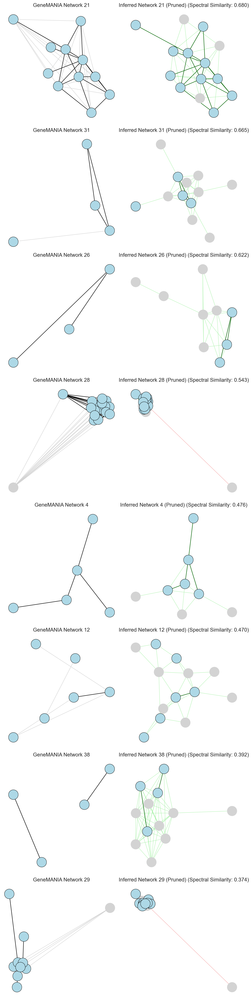

Plotting cluster 11 with similarity spectral=0.601...
Plotting cluster 3 with similarity spectral=0.456...
Plotting cluster 6 with similarity spectral=0.419...
Plotting cluster 13 with similarity spectral=0.412...
Plotting cluster 5 with similarity spectral=0.404...
Plotting cluster 8 with similarity spectral=0.402...
Plotting cluster 7 with similarity spectral=0.391...
Plotting cluster 4 with similarity spectral=0.370...
Plotting cluster 0 with similarity spectral=0.367...
Plotting cluster 10 with similarity spectral=0.356...
Plotting cluster 9 with similarity spectral=0.330...
Plotting cluster 2 with similarity spectral=0.327...


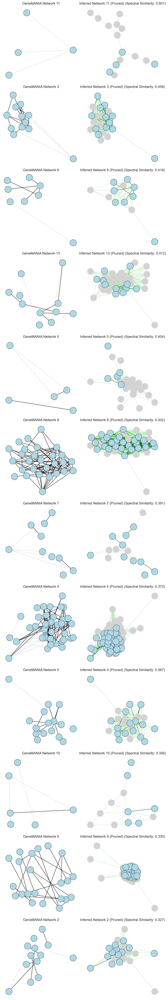

Plotting cluster 27 with similarity spectral=0.588...
Plotting cluster 3 with similarity spectral=0.586...
Plotting cluster 5 with similarity spectral=0.557...
Plotting cluster 12 with similarity spectral=0.464...
Plotting cluster 28 with similarity spectral=0.459...
Plotting cluster 11 with similarity spectral=0.410...
Plotting cluster 22 with similarity spectral=0.359...
Plotting cluster 25 with similarity spectral=0.351...
Plotting cluster 2 with similarity spectral=0.000...
Plotting cluster 10 with similarity spectral=0.000...
Plotting cluster 15 with similarity spectral=0.000...
Plotting cluster 20 with similarity spectral=0.000...


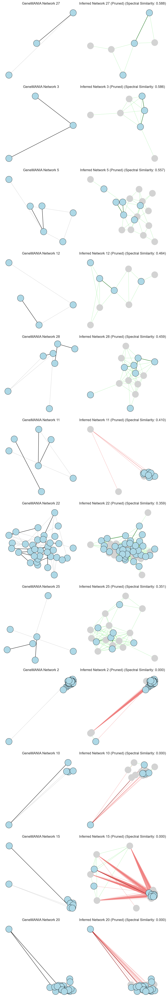

Plotting cluster 0 with similarity spectral=0.655...
Plotting cluster 14 with similarity spectral=0.407...
Plotting cluster 11 with similarity spectral=0.373...
Plotting cluster 15 with similarity spectral=0.339...


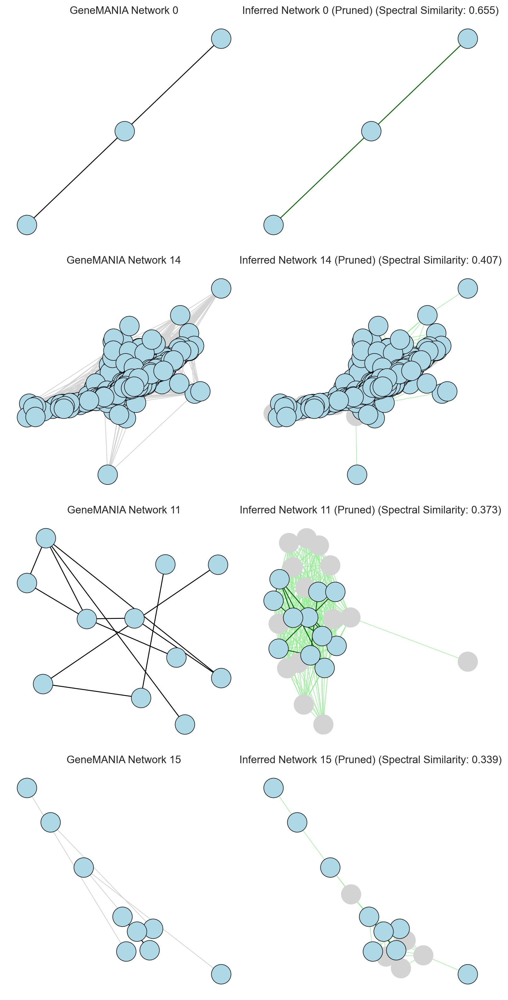

Plotting cluster 43 with similarity spectral=0.586...
Plotting cluster 11 with similarity spectral=0.551...
Plotting cluster 30 with similarity spectral=0.474...
Plotting cluster 23 with similarity spectral=0.383...
Plotting cluster 39 with similarity spectral=0.380...
Plotting cluster 13 with similarity spectral=0.370...
Plotting cluster 0 with similarity spectral=0.367...
Plotting cluster 22 with similarity spectral=0.366...
Plotting cluster 6 with similarity spectral=0.354...
Plotting cluster 2 with similarity spectral=0.349...
Plotting cluster 38 with similarity spectral=0.345...
Plotting cluster 1 with similarity spectral=0.337...
Plotting cluster 5 with similarity spectral=0.336...
Plotting cluster 27 with similarity spectral=0.330...


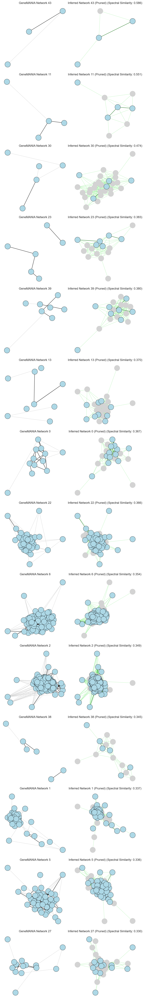

[(43,
  0.5862016504170058),
 (11,
  0.5505847681343906),
 (30,
  0.4738750862557599),
 (23,
  0.3826531261374139),
 (39,
  0.38045013695491087),
 (13,
  0.3695433819779585),
 (0,
  0.36685878929114835),
 (22,
  0.36573705264771),
 (6,
  0.3540956706785064),
 (2,
  0.34856157616815114),
 (38,
  0.3450324300054656),
 (1,
  0.33685313127466543),
 (5,
  0.33584447600655154),
 (27,
  0.3303370414070847)]

In [46]:
## Change dpi = 500 for high quality

### Simple plots
# plot_all_networks_with_auroc(genemania_log, log_cluster_networks, prune_inferred_edges=True, 
#                                        combined_layout=True, save_path='./results/plots_thyroid/log_networks_simple', simple_plot=True)

# plot_all_networks_with_auroc(genemania_mlp, mlp_cluster_networks, prune_inferred_edges=True, 
#                                         combined_layout=True, save_path='./results/plots_thyroid/mlp_networks_simple', simple_plot=True)

# plot_all_networks_with_auroc(genemania_cnn, cnn_cluster_networks, prune_inferred_edges=True, 
#                                        combined_layout=True, save_path='./results/plots_thyroid/cnn_networks_simple', simple_plot=True)

# plot_all_networks_with_auroc(genemania_gnn, gnn_cluster_networks, prune_inferred_edges=True, 
#                                         combined_layout=True, save_path='./results/plots_thyroid/gnn_networks_simple', simple_plot=True)

# plot_all_networks_with_auroc(genemania_trn, trn_cluster_networks, prune_inferred_edges=True, 
#                                        combined_layout=True, save_path='./results/plots_thyroid/log_networks_simple', simple_plot=True)

plot_all_networks_with_auroc(genemania_log, log_cluster_networks, prune_inferred_edges=True, 
                                       combined_layout=True, save_path=None, simple_plot=True)

plot_all_networks_with_auroc(genemania_mlp, mlp_cluster_networks, prune_inferred_edges=True, 
                                        combined_layout=True, save_path=None, simple_plot=True)

plot_all_networks_with_auroc(genemania_cnn, cnn_cluster_networks, prune_inferred_edges=True, 
                                       combined_layout=True, save_path=None, simple_plot=True)

plot_all_networks_with_auroc(genemania_gnn, gnn_cluster_networks, prune_inferred_edges=True, 
                                        combined_layout=True, save_path=None, simple_plot=True)

plot_all_networks_with_auroc(genemania_trn, trn_cluster_networks, prune_inferred_edges=True, 
                                       combined_layout=True, save_path=None, simple_plot=True)

In [47]:
# ### full plots
# log_graphs_peF_clF = plot_all_networks_with_auroc(genemania_log, log_cluster_networks, prune_inferred_edges=True, 
#                                        combined_layout=False, save_path='./results/plots_thyroid/log_networks')

# mlp_graphs_peF_clF =  plot_all_networks_with_auroc(genemania_mlp, mlp_cluster_networks, prune_inferred_edges=True, 
#                                         combined_layout=False, save_path='./results/plots_thyroid/mlp_networks')

# cnn_graphs_peF_clF = plot_all_networks_with_auroc(genemania_cnn, cnn_cluster_networks, prune_inferred_edges=True, 
#                                        combined_layout=False, save_path='./results/plots_thyroid/cnn_networks')

# gnn_graphs_peF_clF =  plot_all_networks_with_auroc(genemania_gnn, gnn_cluster_networks, prune_inferred_edges=True, 
#                                         combined_layout=False, save_path='./results/plots_thyroid/gnn_networks')

# trn_graphs_peF_clF = plot_all_networks_with_auroc(genemania_trn, trn_cluster_networks, prune_inferred_edges=True, 
#                                        combined_layout=False, save_path='./results/plots_thyroid/log_networks')
